# LendingClub Project

**Project context**

Imagine that you are a data scientist who was just hired by the LendingClub. They want to automate their lending decisions fully, and they hired you to lead this project. Your team consists of a product manager to help you understand the business domain and a software engineer who will help you integrate your solution into their product. During the initial investigations, you've found that there was a similar initiative in the past, and luckily for you, they have left a somewhat clean dataset of LendingClub's loan data. The dataset is located in a public bucket here: (although you were wondering if having your client data in a public bucket is such a good idea). In the first meeting with your team, you all have decided to use this dataset because it will allow you to skip months of work of building a dataset from scratch. In addition, you have decided to tackle this problem iteratively so that you can get test your hypothesis that you can automate these decisions and get actual feedback from the users as soon as possible. For that, you have proposed a three-step plan on how to approach this problem. The first step of your plan is to create a machine learning model to classify loans into accepted/rejected so that you can start learning if you have enough data to solve this simple problem adequately. The second step is to predict the grade for the loan, and the third step is to predict the subgrade and the interest rate. Your team likes the plan, especially because after every step, you'll have a fully-working deployed model that your company can use. Excitedly you get to work!

This project would consist of 4 parts:
- Creating the loan classifier;
- Creating the grade classifier;
- Creating the sub grade classifier;
- Creating the interest rate regressor;

The final models would be then used to create an API deployed on google cloud platform. They would be used as a three stage model where first loan would be classified as either accepted or rejected. If the loan is accepted the grade would be predicted and by using grade, subgrade and interest rate would also be predicted. In the case of rejected loans nothing further would be done.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import duckdb

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.dummy import DummyClassifier, DummyRegressor
from sklearn.linear_model import LogisticRegression, LinearRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import recall_score, precision_score, roc_auc_score,\
    average_precision_score, r2_score, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import OneHotEncoder, RobustScaler, LabelEncoder

from ds_utils import inspect_df, with_hue, evaluate_models, plot_subplots_barplots,\
    cross_validate_models, plot_cm_pr_roc_curves, plot_cm_pr_roc_curves_yb, plot_subplots,\
    plot_residuals_yb

import xgboost
from xgboost import XGBClassifier, XGBRegressor
from lightgbm import LGBMClassifier, LGBMRegressor
from umap import UMAP
from shaphypetune import BoostBoruta
import optuna 
from optuna import Trial
from optuna.samplers import TPESampler
import joblib
import shap
import requests
from scipy import stats

USE_PRECOMPUTED_DF means whether to use precomputed dataframes that were saved to csv files or compute them from raw data.

In [2]:
USE_PRECOMPUTED_DF = True

## Data loading

### Accepted loans dataset

In [18]:
if not USE_PRECOMPUTED_DF:
    date_cols = [
        'issue_d', 'earliest_cr_line', 'last_pymnt_d', 'next_pymnt_d', 
        'last_credit_pull_d', 'sec_app_earliest_cr_line', 'hardship_start_date', 
        'hardship_end_date', 'payment_plan_start_date', 
        'debt_settlement_flag_date', 'settlement_date'
    ]

    accepted_df = pd.read_csv('accepted_2007_to_2018Q4.csv', parse_dates=date_cols)

    accepted_df.info()

Columns (0,19,59,129,130,131,139,146) have mixed types. Specify dtype option on import or set low_memory=False.


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2260701 entries, 0 to 2260700
Columns: 151 entries, id to settlement_term
dtypes: datetime64[ns](11), float64(113), object(27)
memory usage: 2.5+ GB


### Rejected loans dataset

In [4]:
if not USE_PRECOMPUTED_DF:
    rejected_df = pd.read_csv('rejected_2007_to_2018Q4.csv', parse_dates=['Application Date'])

    rejected_df.info()
    rejected_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27648741 entries, 0 to 27648740
Data columns (total 9 columns):
 #   Column                Dtype         
---  ------                -----         
 0   Amount Requested      float64       
 1   Application Date      datetime64[ns]
 2   Loan Title            object        
 3   Risk_Score            float64       
 4   Debt-To-Income Ratio  object        
 5   Zip Code              object        
 6   State                 object        
 7   Employment Length     object        
 8   Policy Code           float64       
dtypes: datetime64[ns](1), float64(3), object(5)
memory usage: 1.9+ GB


## Loan classification

### Data preprocessing and feature engineering

**Creating the dataset for loan classification**

In [5]:
if not USE_PRECOMPUTED_DF:
    loan_clf_df = duckdb.query("""
    --sql
    WITH t1 AS (
    SELECT loan_amnt loan_amount_requested, 
    issue_d application_date, 
    title loan_title, 
    ((fico_range_low + fico_range_high) / 2) credit_score, 
    dti dept_to_income_ratio, 
    zip_code, 
    addr_state state, 
    emp_length employment_length, 
    policy_code,
    1 accepted
    FROM accepted_df

    UNION

    SELECT "Amount Requested" loan_amount_requested, 
    "Application Date" application_date, 
    "Loan Title" loan_title, 
    Risk_Score credit_score, 
    CAST(REPLACE("Debt-To-Income Ratio", '%', '') AS float) dept_to_income_ratio, 
    "Zip Code" zip_code, 
    State state, 
    "Employment Length" employment_length, 
    "Policy Code" policy_code,
    0 accepted
    FROM rejected_df)

    SELECT *
    FROM t1
    ORDER BY application_date;
    """).to_df()

**Preprocessing and feature creation**

In [7]:
def loan_clf_data_preprocessing(df: pd.DataFrame) -> None:
    # Drop the policy_code column, because it is the same as the target
    try:
        df.drop(columns='policy_code', inplace=True)
    except KeyError:
        pass

    # Cleaning loan_title data and reducing cardinality by merging categories
    # with low count
    df['loan_title'] = df['loan_title'].str.strip()
    df['loan_title'] = df['loan_title'].str.lower()
    df['loan_title'] = df['loan_title'].str.replace(' ', '_')

    counts = df['loan_title'].value_counts()
    categories = counts[counts>1000].index

    df['loan_title'] = df['loan_title'].apply(
        lambda x: x if x in categories else 'other')

    # Creating cycle variables for week days
    df['dayofweek_sin'] = np.sin(2*np.pi*df['application_date'].dt.day_of_week/7.0)
    df['dayofweek_cos'] = np.cos(2*np.pi*df['application_date'].dt.day_of_week/7.0)

    # Creating cycle variables for months
    df['month_sin'] = np.sin(2*np.pi*df['application_date'].dt.month/12.0)
    df['month_cos'] = np.cos(2*np.pi*df['application_date'].dt.month/12.0)

    # Taking the log of loan_amount_requested and dept_to_income_ratio
    # because of them being highly skewed towards high values
    df['loan_amount_requested'] = df['loan_amount_requested'].apply(
        lambda x: np.log(x) if x!=0 else x)
    df['dept_to_income_ratio'] = df['dept_to_income_ratio'].apply(
        lambda x: np.log(x) if x!=0 else x)

In [3]:
if not USE_PRECOMPUTED_DF:
    loan_clf_data_preprocessing(loan_clf_df)

    loan_clf_df.to_csv('loan_clf.csv', index=False)
else:
    loan_clf_df = pd.read_csv(
        'loan_clf.csv', parse_dates=['application_date'])

loan_clf_df.info()
loan_clf_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29751452 entries, 0 to 29751451
Data columns (total 13 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   loan_amount_requested  float64       
 1   application_date       datetime64[ns]
 2   loan_title             object        
 3   credit_score           float64       
 4   dept_to_income_ratio   float64       
 5   zip_code               object        
 6   state                  object        
 7   employment_length      object        
 8   accepted               int64         
 9   dayofweek_sin          float64       
 10  dayofweek_cos          float64       
 11  month_sin              float64       
 12  month_cos              float64       
dtypes: datetime64[ns](1), float64(7), int64(1), object(4)
memory usage: 2.9+ GB


,loan_amount_requested,application_date,loan_title,credit_score,dept_to_income_ratio,zip_code,state,employment_length,accepted,dayofweek_sin,dayofweek_cos,month_sin,month_cos
0,NaN,NaT,other,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN
1,6.907755,2007-05-26,other,693.0,2.302585,481xx,NM,4 years,0,-0.974928,-0.222521,0.5,-0.866025
2,6.907755,2007-05-26,other,703.0,2.302585,010xx,MA,< 1 year,0,-0.974928,-0.222521,0.5,-0.866025
3,8.699515,2007-05-27,other,698.0,3.654288,017xx,MA,< 1 year,0,-0.781831,0.623490,0.5,-0.866025
4,7.313220,2007-05-27,other,509.0,2.243896,209xx,MD,< 1 year,0,-0.781831,0.623490,0.5,-0.866025


**Data preprocessing pipeline**

In [7]:
features = [
    'loan_amount_requested','loan_title','credit_score',
    'dept_to_income_ratio','zip_code','state','employment_length',
    'dayofweek_sin','dayofweek_cos','month_sin','month_cos'
]

num_features = [
    'loan_amount_requested','credit_score','dept_to_income_ratio',
    'dayofweek_sin','dayofweek_cos'
]

num_transformer = Pipeline(
    steps=[
        ("scaler", RobustScaler()),
        ("num_imputer", SimpleImputer(strategy='median', add_indicator=True))
    ]
)

cat_features = ['loan_title','zip_code','state','employment_length']

cat_transformer = Pipeline(
    steps=[
        ("cat_imputer", SimpleImputer(strategy="most_frequent", add_indicator=True)),
        ("oh_encoder", OneHotEncoder(drop='if_binary', handle_unknown="ignore"))
    ]
)

col_transformer = ColumnTransformer(
    transformers=[
        ("num", num_transformer, num_features),
        ("cat", cat_transformer, cat_features),
    ]
)

**Splitting data**

We will be taking 5% of data for testing.

In [4]:
loan_clf_train_df, loan_clf_test_df = train_test_split(
    loan_clf_df, test_size=0.05, stratify=loan_clf_df['accepted'], random_state=0)

Through out this project samples are used of the whole dataset to reduce running time of model selection, hyperparameter tuning and so on.

In [55]:
if not USE_PRECOMPUTED_DF:
    loan_clf_train_sample_df = loan_clf_train_df.sample(frac=0.01, random_state=0)
    
    loan_clf_train_sample_df.to_csv('loan_clf_train_sample.csv', index=False)
else:
    loan_clf_train_sample_df = pd.read_csv(
        'loan_clf_train_sample.csv', parse_dates=['application_date'])

### EDA

In [13]:
_ = inspect_df(loan_clf_train_sample_df, sel_nan_above_perc=50)

Rows with NaN values in each column:

              percentage   count
credit_score   61.633745  174201

No duplicate rows


In [14]:
loan_clf_train_sample_df.select_dtypes('object').describe()

,loan_title,zip_code,state,employment_length
count,282639,282636,282639,272066
unique,50,926,51,11
top,debt_consolidation,112xx,CA,< 1 year
freq,127775,2758,33456,218594


In [15]:
loan_clf_train_sample_df.describe(include=['int', 'float', 'datetime'], datetime_is_numeric=True)

,loan_amount_requested,application_date,credit_score,dept_to_income_ratio,accepted,dayofweek_sin,dayofweek_cos,month_sin,month_cos
count,282639.000000,282639,108438.000000,271477.000000,282639.000000,282639.000000,282639.000000,2.826390e+05,2.826390e+05
mean,9.040565,2016-12-17 15:18:49.105325056,642.717202,2.839739,0.075718,0.158174,0.015298,-8.449944e-02,-7.017087e-03
min,0.000000,2007-05-28 00:00:00,0.000000,-4.605170,0.000000,-0.974928,-0.900969,-1.000000e+00,-1.000000e+00
25%,8.517193,2016-01-24 00:00:00,605.000000,2.308567,0.000000,-0.433884,-0.900969,-8.660254e-01,-8.660254e-01
50%,9.210340,2017-05-29 00:00:00,655.000000,3.026262,0.000000,0.433884,-0.222521,-2.449294e-16,-1.836970e-16
75%,9.903488,2018-04-19 00:00:00,689.000000,3.583797,0.000000,0.781831,0.623490,5.000000e-01,8.660254e-01
max,12.611538,2018-12-31 00:00:00,990.000000,14.684458,1.000000,0.974928,1.000000,1.000000e+00,1.000000e+00
std,1.022766,NaN,86.359025,1.362488,0.264548,0.674357,0.721105,6.947968e-01,7.141929e-01


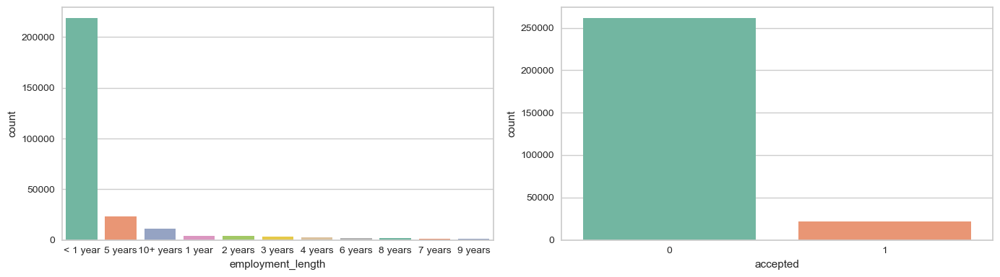

In [16]:
cols = ['employment_length','accepted']

fig, ax = plt.subplots(
    nrows=1, ncols=len(cols), figsize=(14,4))

for i in range(len(cols)):
    sns.countplot(
        data=loan_clf_train_sample_df,
        x=cols[i],
        palette='Set2',
        order=loan_clf_train_sample_df[cols[i]].value_counts().index,
        ax=ax[i]
    )

plt.tight_layout()
plt.show()

Observations:
- Most people asking for loans have worked less than a year.
- Most applications for loans were rejected

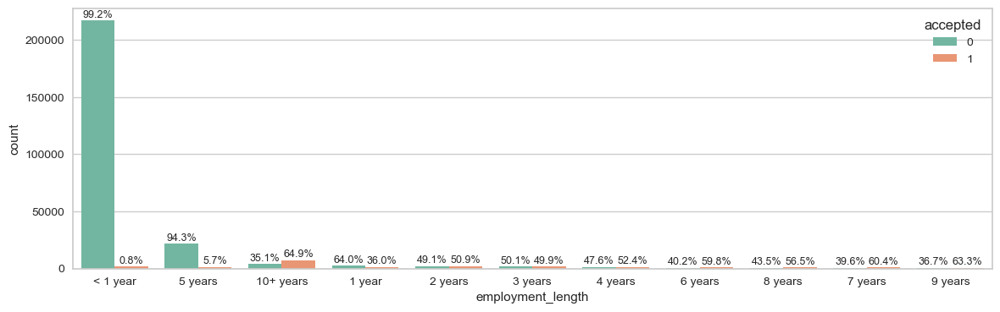

In [17]:
plt.figure(figsize=(14,4))

order = loan_clf_train_sample_df['employment_length']\
    .value_counts(ascending=False).index

ax = sns.countplot(
    data=loan_clf_train_sample_df,
    x='employment_length',
    hue='accepted',
    order=order,
    palette='Set2'
)

with_hue(
    ax,
    loan_clf_train_sample_df['employment_length'],
    loan_clf_train_sample_df['employment_length'].nunique(),
    loan_clf_train_sample_df['accepted'].nunique()
)

Observations:
- Percentage of rejected loans is very high for people who have worked less than a year and as years increases it evens out or becomes less than accepted.

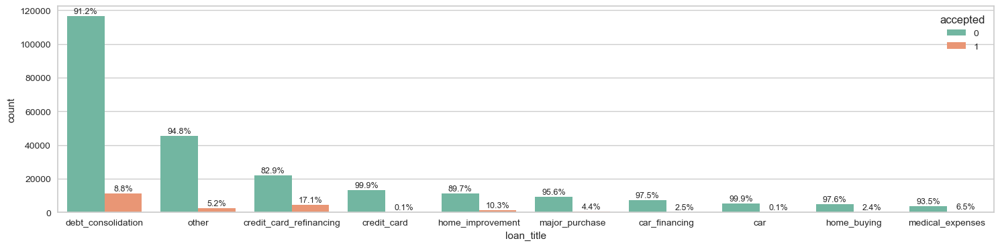

In [62]:
plt.figure(figsize=(18,4))

order = loan_clf_train_sample_df['loan_title']\
    .value_counts(ascending=False).index[:10]

df = loan_clf_train_sample_df[
    loan_clf_train_sample_df['loan_title'].isin(order)]

ax = sns.countplot(
    data=df,
    x='loan_title',
    hue='accepted',
    order=order,
    palette='Set2'
)

with_hue(
    ax,
    df['loan_title'],
    df['loan_title'].nunique(),
    df['accepted'].nunique()
)

Observations:
- We might see higher percentage of acceptance for dept_consolidation, credit_card_refinancing and home_improvement.

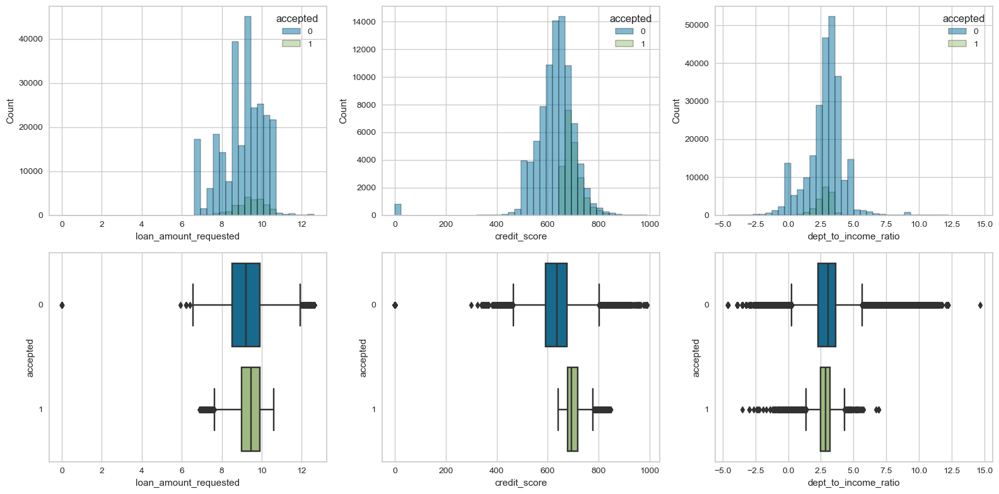

In [19]:
cols = ['loan_amount_requested','credit_score','dept_to_income_ratio']

fig, ax = plt.subplots(2, len(cols), figsize=(16,8))

for i in range(len(cols)):
    sns.histplot(
        data=loan_clf_train_sample_df,
        x=cols[i],
        hue='accepted',
        bins=40,
        ax=ax[0][i]
    )
    sns.boxplot(
        data=loan_clf_train_sample_df,
        x=cols[i],
        y='accepted',
        orient='h',
        ax=ax[1][i]
    )

plt.tight_layout()

Observations:
- Naturaly we see that with higher credit score there are more accepted loans.

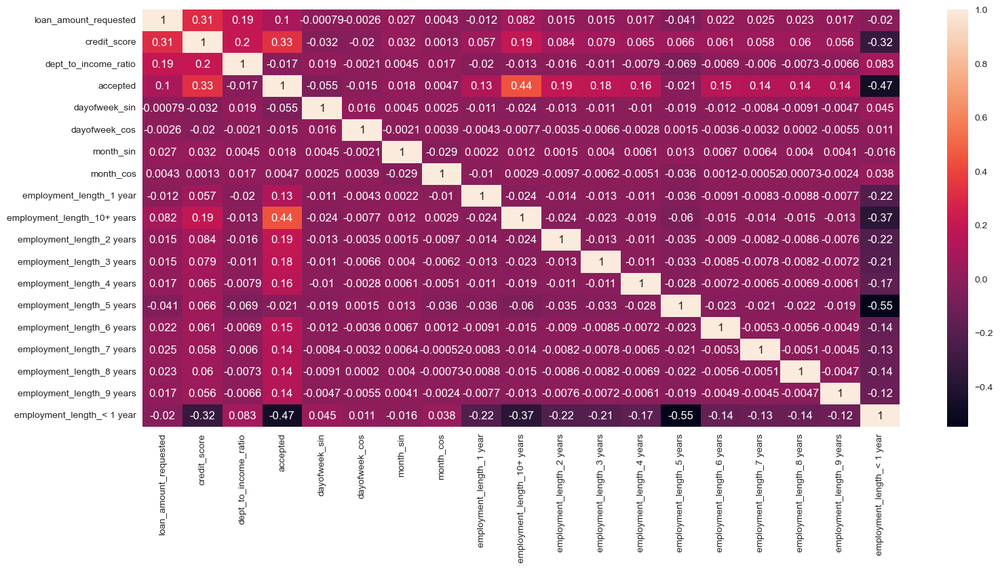

In [20]:
plt.figure(figsize=(18,8))

cols = [
    'loan_amount_requested','credit_score',
    'dept_to_income_ratio','employment_length',
    'accepted', 'dayofweek_sin', 'dayofweek_cos',
    'month_sin', 'month_cos'
]

sns.heatmap(
    data=pd.get_dummies(loan_clf_train_sample_df[cols]).corr(),
    annot=True
)

plt.show()

Observations:
- We see as the years go down the correlation becomes negative for accepted loans.
- Also there is a positve correlation between loan_amount_requested and credit score.

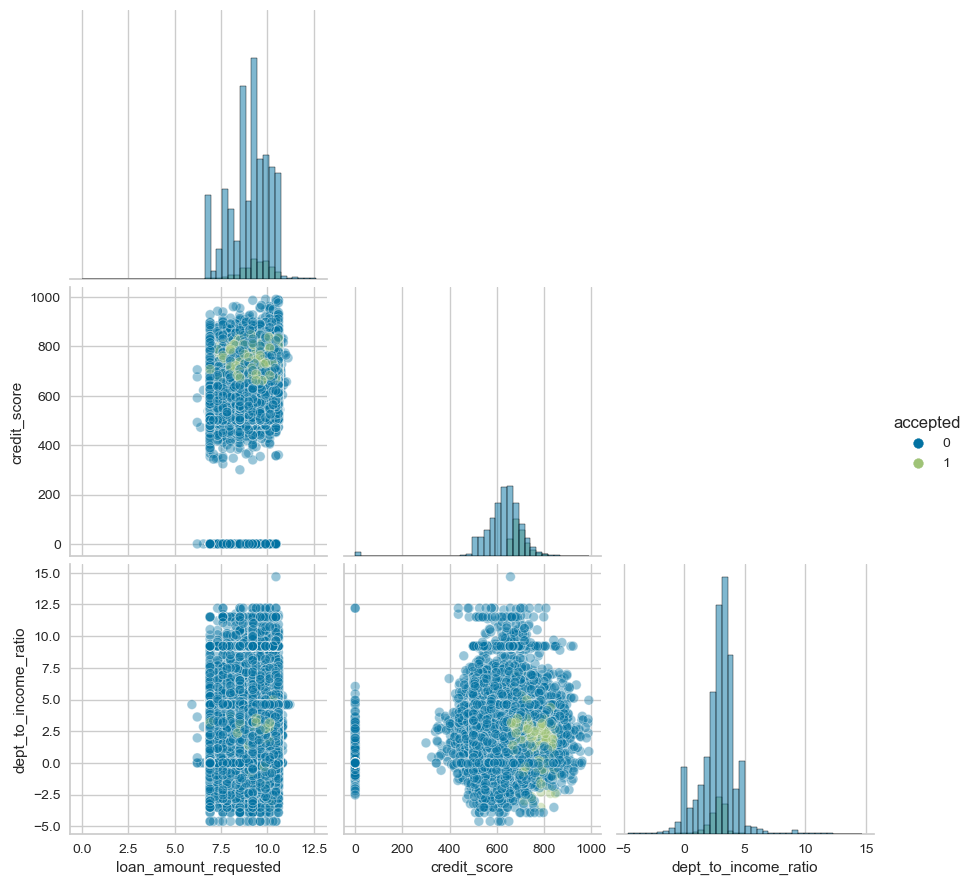

In [21]:
cols = ['loan_amount_requested','credit_score','dept_to_income_ratio']

sns.pairplot(
    data=loan_clf_train_sample_df[[*cols,'accepted']],
    hue='accepted',
    plot_kws={'alpha':0.4},
    diag_kind='hist',
    diag_kws={'bins':40},
    corner=True,
    height=3
)

plt.show()

Observations:
- There is some visible non-linear seperability in terms of credit_score and dept_to_income_ratio and in terms of credit_score and loan_amount_requested.

**Dimensionality reduction**

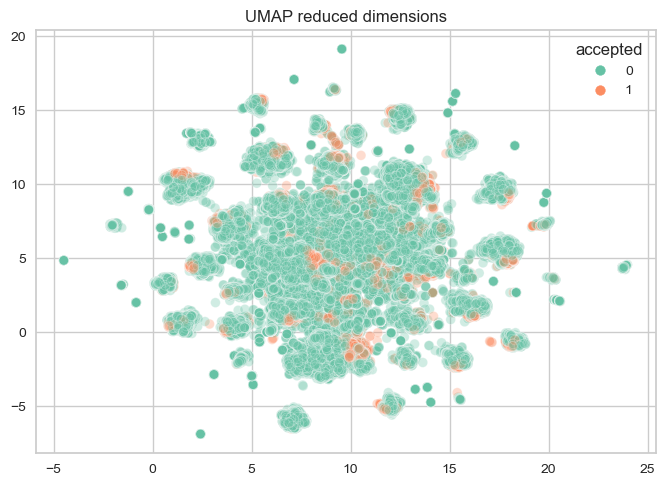

In [23]:
X_train_dr = col_transformer.fit_transform(
    loan_clf_train_sample_df[features])

X_reduced_umap = UMAP().fit_transform(X_train_dr)

ax = sns.scatterplot(
    x=X_reduced_umap[:,0],
    y=X_reduced_umap[:,1],
    hue=loan_clf_train_sample_df['accepted'],
    alpha=0.3,
    palette='Set2'
)

ax.set_title('UMAP reduced dimensions')

plt.show()

UMAP reduced dataset dimensions to just two dimensions for visualization. From what we see, there are some blobs of data where there are only accepted labels.

### Model and feature selection

**Model selection**

In [13]:
X_train = loan_clf_train_sample_df[features].astype(
    {col:'category' for col in cat_features})

y_train = loan_clf_train_sample_df['accepted']

In [10]:
d_clf = DummyClassifier(strategy='most_frequent', random_state=0)

xgb_clf = XGBClassifier(
    random_state=0, enable_categorical=True, tree_method='hist')

lgbm_clf = LGBMClassifier(random_state=0)

lr_clf = Pipeline(steps=[
    ('preprocessor', col_transformer),
    ('classifier', LogisticRegression(class_weight='balanced', C=0.8))
])

In [26]:
metrics = ['roc_auc', 'average_precision']

models = {
    'Dummy':d_clf,
    'LogisticRegression':lr_clf,
    'XGBoost':xgb_clf,
    'LGBM':lgbm_clf
}

cross_validate_models(
    models=models,
    preprocessor=None,
    X_train=X_train,
    y_train=y_train,
    metrics=metrics,
    cv_folds=10
)

,model_name,mean_roc_auc,std_roc_auc,mean_average_precision,std_average_precision
0,Dummy,0.500,0.000,0.076,0.000
1,LogisticRegression,0.986,0.001,0.784,0.008
2,XGBoost,0.997,0.000,0.961,0.004
3,LGBM,0.998,0.000,0.962,0.006


**Feature selection**

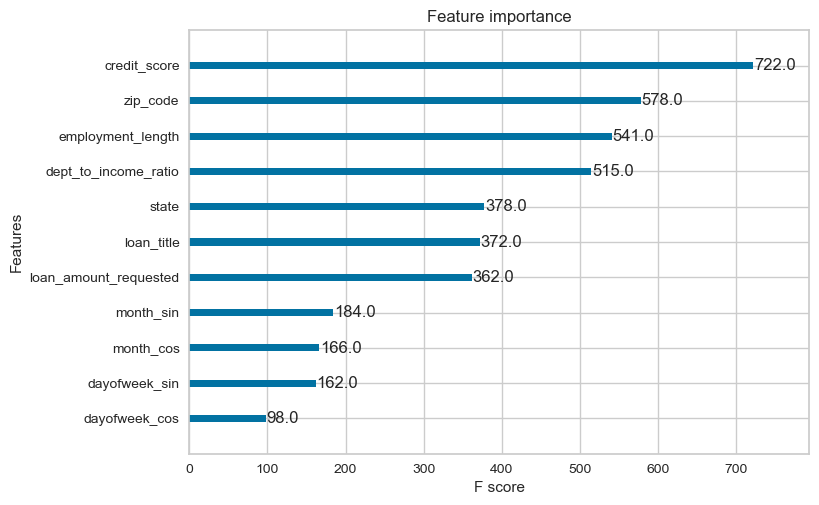

In [27]:
xgb_clf.fit(X_train, y_train)

xgboost.plot_importance(xgb_clf)

plt.show()

Boruta algorithm is used to select the most important features.

In [ ]:
X, X_val, y, y_val = train_test_split(
    X_train, y_train, test_size=0.1, stratify=y_train, random_state=0)

rfe = BoostBoruta(xgb_clf)
_ = rfe.fit(X, y, eval_set=[(X_val, y_val)], early_stopping_rounds=6)

cols_selected = X_train.iloc[:,rfe.get_support()].columns

In [32]:
cols_selected

Index(['loan_title', 'credit_score', 'employment_length'], dtype='object')

In [33]:
cross_validate_models(
    models={
        'XGBoost':xgb_clf,
        'LGBM':lgbm_clf
    },
    preprocessor=None,
    X_train=X_train[cols_selected],
    y_train=y_train,
    metrics=metrics,
    cv_folds=10
)

,model_name,mean_roc_auc,std_roc_auc,mean_average_precision,std_average_precision
0,XGBoost,0.997,0.0,0.954,0.005
1,LGBM,0.998,0.0,0.964,0.004


We have reduced tha data to just 3 dimensions and get pretty much the same results.

In [14]:
X_train = X_train[cols_selected]

micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging
micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging
micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging


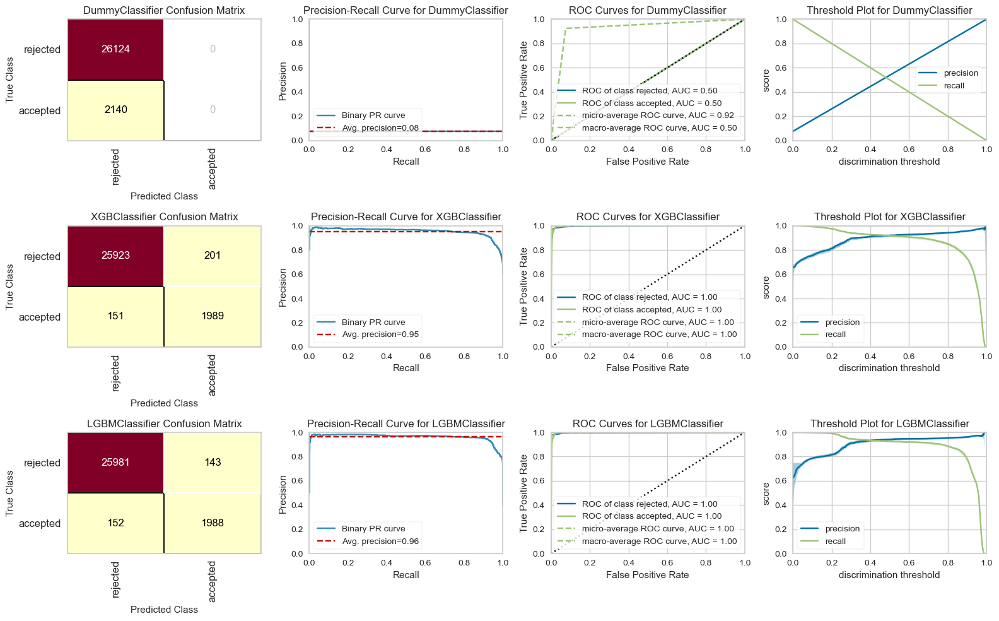

In [44]:
plot_cm_pr_roc_curves_yb(
    models={
        'Dummy':d_clf,
        'XGBoost':xgb_clf,
        'LGBM':lgbm_clf
    },
    X=X_train,
    y=y_train,
    plot_size=(16, 10),
    class_labels=['rejected','accepted'],
    folds=10
)

We can see that LGBM has less false positves than xgboost, but other than their performance is similar.

### Hyperparameter tuning

In [3]:
def xgb_objective(trial: Trial, X, y, cv=4, preproc=None, 
    score='average_precision', classification=True) -> float:
    
    param = {
        "n_estimators" : trial.suggest_int('n_estimators', 50, 1000, step=50),
        'max_depth':trial.suggest_int('max_depth', 2, 25),
        'reg_alpha':trial.suggest_float('reg_alpha', 0, 5, step=0.1),
        'reg_lambda':trial.suggest_float('reg_lambda', 0, 5, step=0.1),
        'min_child_weight':trial.suggest_int('min_child_weight', 0, 5),
        'gamma':trial.suggest_float('gamma', 0, 5, step=0.1),
        'learning_rate':trial.suggest_float('learning_rate', 0.01, 
                                            0.4, step=0.01),
        'colsample_bytree':trial.suggest_float('colsample_bytree', 0.1, 
                                               1, step=0.1),
        'subsample':trial.suggest_float('subsample', 0.1, 1, step=0.1),
        'nthread' : -1,
        'random_state':0,
        'enable_categorical':True,
        'tree_method':'hist'
    }
    
    if classification:
        model = XGBClassifier(**param)
    else:
        model = XGBRegressor(**param)

    if preproc is not None:
        model = Pipeline(steps=[('preproc', preproc), ('clf', model)])
    
    return cross_val_score(model, X, y, cv=cv, scoring=score).mean()

In [ ]:

optimized_models = {}

xgb_study = optuna.create_study(direction='maximize', sampler=TPESampler())
xgb_study.optimize(
    lambda trial : xgb_objective(trial, X_train, y_train),
    n_trials=100,
    n_jobs=-1
)

optimized_models['XGBoost'] = XGBClassifier(
    enable_categorical=True,
    tree_method='hist',
    nthread=-1,
    random_state=0,
    **xgb_study.best_trial.params
)

In [75]:
optimized_models['XGBoost']

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7000000000000001, early_stopping_rounds=None,
              enable_categorical=True, eval_metric=None, feature_types=None,
              gamma=1.3, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=21, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              n_estimators=800, n_jobs=None, nthread=-1, num_parallel_tree=None,
              predictor=None, ...)

In [4]:
def lgbm_objective(trial: Trial, X, y, cv=4, preproc=None, 
    score='average_precision', classification=True):
    
    param = {
        "n_estimators" : trial.suggest_int('n_estimators', 50, 1000, step=50),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 20, 3000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 
                                              10000, step=100),
        "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.01
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.01
        ),
        'random_state':0
    }

    if classification:
        model = LGBMClassifier(**param)
    else:
        model = LGBMRegressor(**param)

    if preproc is not None:
        model = Pipeline(steps=[('preproc', preproc), ('clf', model)])
    
    return cross_val_score(model, X, y, cv=cv, scoring=score).mean()

In [ ]:
lgbm_study = optuna.create_study(direction='maximize', sampler=TPESampler())
lgbm_study.optimize(
    lambda trial : lgbm_objective(trial, X_train, y_train),
    n_trials=100,
    n_jobs=-1
)

optimized_models['LGBM'] = LGBMClassifier(
    random_state=0,
    **lgbm_study.best_trial.params
)

In [79]:
optimized_models['LGBM']

LGBMClassifier(bagging_fraction=0.9199999999999999, bagging_freq=1,
               feature_fraction=0.95, lambda_l1=0, lambda_l2=50,
               learning_rate=0.29320325700312627, max_depth=12,
               min_data_in_leaf=8000, min_gain_to_split=0.6783394136810804,
               n_estimators=850, num_leaves=400, random_state=0)

In [78]:
cross_validate_models(
    models=optimized_models,
    X_train=X_train,
    y_train=y_train,
    metrics=metrics,
    cv_folds=10
)

,model_name,mean_roc_auc,std_roc_auc,mean_average_precision,std_average_precision
0,XGBoost,0.997,0.0,0.957,0.003
1,LGBM,0.998,0.0,0.964,0.004


We can see that hyperparameter tuning didn't increase performance, so we can just use the default parameters.

### Evaluation on test set

In [15]:
loan_clf_train_df = loan_clf_train_df.astype(
    {col:'category' for col in cat_features})

loan_clf_test_df = loan_clf_test_df.astype(
    {col:'category' for col in cat_features})

metrics_fcn = {
    'recall':recall_score, 
    'precision':precision_score, 
    'roc_auc':roc_auc_score, 
    'pr_auc':average_precision_score
}

results, fitted_models = evaluate_models(
    models={'XGBoost':xgb_clf, 'LGBM':lgbm_clf},
    X_train=loan_clf_train_df[cols_selected],
    y_train=loan_clf_train_df['accepted'],
    X_test=loan_clf_test_df[cols_selected],
    y_test=loan_clf_test_df['accepted'],
    metrics_fcn=metrics_fcn,
    preprocessor=None,
    return_models=True
)

results

,model_name,recall,precision,roc_auc,pr_auc
0,XGBoost,0.918,0.919,0.956,0.850
1,LGBM,0.917,0.947,0.956,0.874


micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging
micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging


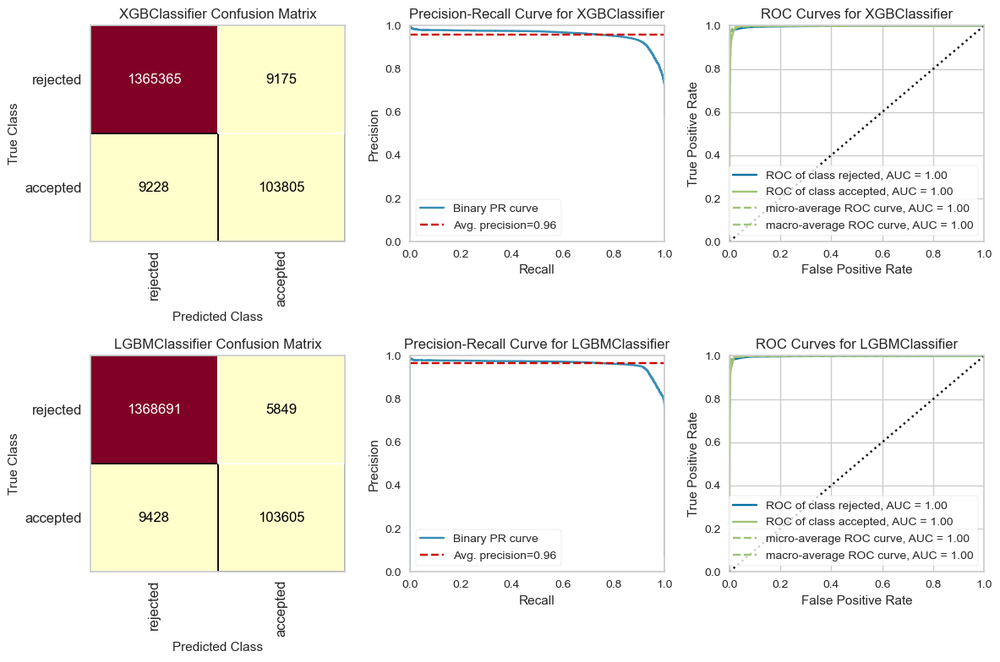

In [21]:
plot_cm_pr_roc_curves_yb(
    models=fitted_models,
    X=X_train,
    y=y_train,
    X_test=loan_clf_test_df[cols_selected],
    y_test=loan_clf_test_df['accepted'],
    plot_size=(12, 8),
    class_labels=['rejected','accepted'],
    plot_threshold=False
)

Judging by these results we can choose LGBM, because it has less false positves.

In [56]:
_ = joblib.dump(fitted_models['LGBM'], "loan_clf_lgbm.pkl")

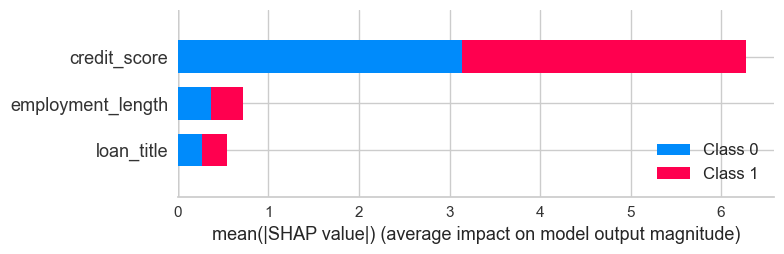

In [36]:
explainer = shap.TreeExplainer(fitted_models['LGBM'])

shap_values = explainer.shap_values(loan_clf_test_df[cols_selected])

shap.summary_plot(shap_values, loan_clf_test_df[cols_selected])

We can see that credit score has the biggest impact on model output. The impact on specific class is somewhat evenly distributed in each feature.

## Grade, subgrade and interest rate prediction for accepted loans

### Data preprocessing and splitting

**Data preprocessing**

In [10]:
def accepted_ds_data_preprocessing(df: pd.DataFrame) -> None:
    # Creating difference in days for date features using issue date
    date_cols = [
        'earliest_cr_line', 'last_pymnt_d', 'next_pymnt_d', 'last_credit_pull_d',
        'sec_app_earliest_cr_line', 'hardship_start_date', 'hardship_end_date',
        'payment_plan_start_date', 'debt_settlement_flag_date', 'settlement_date'
    ]

    for dt_col in date_cols:
        df[dt_col] = (df['issue_d'] - df[dt_col]).dt.days

    # Dropping columns with above 70% mssing values and columns with only unique categories
    # or only one unique value
    high_nan_perc_cols = [
        'id', 'member_id', 'orig_projected_additional_accrued_interest', 
        'hardship_end_date', 'hardship_start_date', 'hardship_type', 'hardship_reason', 
        'hardship_status', 'deferral_term', 'hardship_last_payment_amount', 
        'hardship_payoff_balance_amount', 'hardship_loan_status', 'hardship_dpd', 
        'hardship_length', 'payment_plan_start_date', 'hardship_amount', 'settlement_term', 
        'debt_settlement_flag_date', 'settlement_status', 'settlement_date', 
        'settlement_amount', 'settlement_percentage', 'sec_app_mths_since_last_major_derog', 
        'sec_app_revol_util', 'revol_bal_joint', 'sec_app_mort_acc', 'sec_app_fico_range_low', 
        'sec_app_fico_range_high', 'sec_app_earliest_cr_line', 'sec_app_inq_last_6mths', 
        'sec_app_open_acc', 'sec_app_open_act_il', 'sec_app_num_rev_accts', 
        'sec_app_chargeoff_within_12_mths', 'sec_app_collections_12_mths_ex_med', 
        'verification_status_joint', 'dti_joint', 'annual_inc_joint', 'desc', 
        'mths_since_last_record', 'mths_since_recent_bc_dlq', 'mths_since_last_major_derog',
        'url', 'policy_code'
    ]

    df.drop(columns=high_nan_perc_cols, inplace=True)
    df.dropna(how='all', inplace=True)

    # Cleaning title data and reducing cardinality by merging categories
    # with low count
    df['title'] = df['title'].str.strip()
    df['title'] = df['title'].str.lower()
    df['title'] = df['title'].str.replace(' ', '_')

    counts = df['title'].value_counts()
    categories = counts[counts>500].index

    df['title'] = df['title'].apply(
        lambda x: x if x in categories else 'other')

    # Cleaning emp_title data and reducing cardinality by merging categories
    # with low count
    df['emp_title'] = df['emp_title'].str.strip()
    df['emp_title'] = df['emp_title'].str.lower()
    df['emp_title'] = df['emp_title'].str.replace(' ', '_')

    counts = df['emp_title'].value_counts()
    categories = counts[counts>1000].index

    df['emp_title'] = df['emp_title'].apply(
        lambda x: x if x in categories else 'other')

    # Creating cycle variables for week days
    df['dayofweek_sin'] = np.sin(2*np.pi*df['issue_d'].dt.day_of_week/7.0)
    df['dayofweek_cos'] = np.cos(2*np.pi*df['issue_d'].dt.day_of_week/7.0)

    # Creating cycle variables for months
    df['month_sin'] = np.sin(2*np.pi*df['issue_d'].dt.month/12.0)
    df['month_cos'] = np.cos(2*np.pi*df['issue_d'].dt.month/12.0)

In [3]:
if not USE_PRECOMPUTED_DF:
    accepted_ds_data_preprocessing(accepted_df)

    accepted_df.to_csv('accepted.csv', index=False)
else:
    accepted_df = pd.read_csv(
        'accepted.csv', parse_dates=['issue_d'])
        
accepted_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2260668 entries, 0 to 2260667
Columns: 111 entries, loan_amnt to month_cos
dtypes: datetime64[ns](1), float64(92), object(18)
memory usage: 1.9+ GB


In [22]:
_ = inspect_df(accepted_df)

Rows with NaN values in each column:

                                percentage    count
mths_since_recent_revol_delinq   67.250432  1520309

No duplicate rows


**Data splitting**

In [4]:
accepted_train_df, accepted_test_df = train_test_split(
    accepted_df, test_size=0.1, stratify=accepted_df['grade'], random_state=0)

In [5]:
if not USE_PRECOMPUTED_DF:
    accepted_train_sample_df = accepted_train_df.sample(frac=0.1, random_state=0)
    
    accepted_train_sample_df.to_csv('accepted_train_sample.csv', index=False)
else:
    accepted_train_sample_df = pd.read_csv(
        'accepted_train_sample.csv', parse_dates=['issue_d'])

### EDA

In [25]:
accepted_train_sample_df[
    accepted_train_sample_df.select_dtypes(include='object').columns
].nunique()

term                      2
grade                     7
sub_grade                35
emp_title               214
emp_length               11
home_ownership            6
verification_status       3
loan_status               9
pymnt_plan                2
purpose                  14
title                    47
zip_code                892
addr_state               50
initial_list_status       2
application_type          2
hardship_flag             2
disbursement_method       2
debt_settlement_flag      2
dtype: int64

In [26]:
accepted_train_sample_df\
    .select_dtypes(include='datetime')\
    .describe(datetime_is_numeric=True)

,issue_d
count,203460
mean,2016-05-04 08:11:03.308758528
min,2007-06-01 00:00:00
25%,2015-04-01 00:00:00
50%,2016-07-01 00:00:00
75%,2017-11-01 00:00:00
max,2018-12-01 00:00:00


In [27]:
print(accepted_train_sample_df.select_dtypes(include='float').iloc[0].to_dict())

{'loan_amnt': 6500.0, 'funded_amnt': 6500.0, 'funded_amnt_inv': 6500.0, 'int_rate': 11.06, 'installment': 212.99, 'annual_inc': 53000.0, 'dti': 17.14, 'delinq_2yrs': 0.0, 'earliest_cr_line': 3927.0, 'fico_range_low': 730.0, 'fico_range_high': 734.0, 'inq_last_6mths': 0.0, 'mths_since_last_delinq': nan, 'open_acc': 14.0, 'pub_rec': 0.0, 'revol_bal': 4104.0, 'revol_util': 16.3, 'total_acc': 15.0, 'out_prncp': 5560.08, 'out_prncp_inv': 5560.08, 'total_pymnt': 1285.93, 'total_pymnt_inv': 1285.93, 'total_rec_prncp': 939.92, 'total_rec_int': 346.01, 'total_rec_late_fee': 0.0, 'recoveries': 0.0, 'collection_recovery_fee': 0.0, 'last_pymnt_d': -181.0, 'last_pymnt_amnt': 212.99, 'next_pymnt_d': -212.0, 'last_credit_pull_d': -181.0, 'last_fico_range_high': 719.0, 'last_fico_range_low': 715.0, 'collections_12_mths_ex_med': 0.0, 'acc_now_delinq': 0.0, 'tot_coll_amt': 0.0, 'tot_cur_bal': 74567.0, 'open_acc_6m': 1.0, 'open_act_il': 9.0, 'open_il_12m': 2.0, 'open_il_24m': 3.0, 'mths_since_rcnt_il': 6

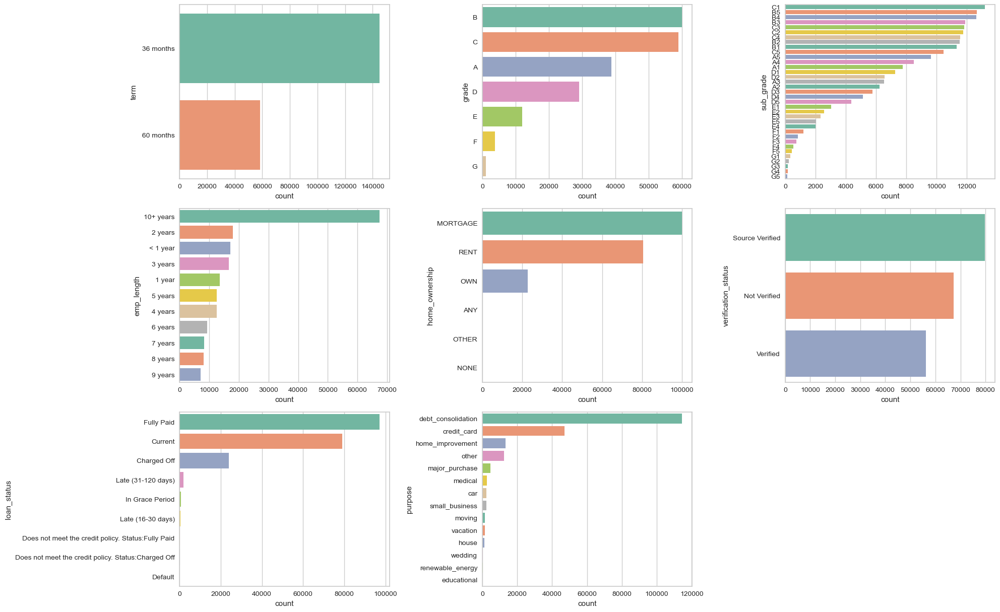

In [48]:
cols = [
    'term', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 
    'verification_status', 'loan_status', 'purpose'
]

plot_subplots_barplots(
    accepted_train_sample_df,
    cols, 
    sns.countplot,
    plot_on_x=False,
    plot_hue=None,
    n_rows=5, 
    n_cols=3, 
    size=(20, 20),
    kwargs={'palette':'Set2'},
    show_percentage=False
)

Observations:
- Most loans are for 36 month term.
- Grade G loans are the rarest.
- Most loans are fully paid.
- Most people who took loans have a house mortgage.

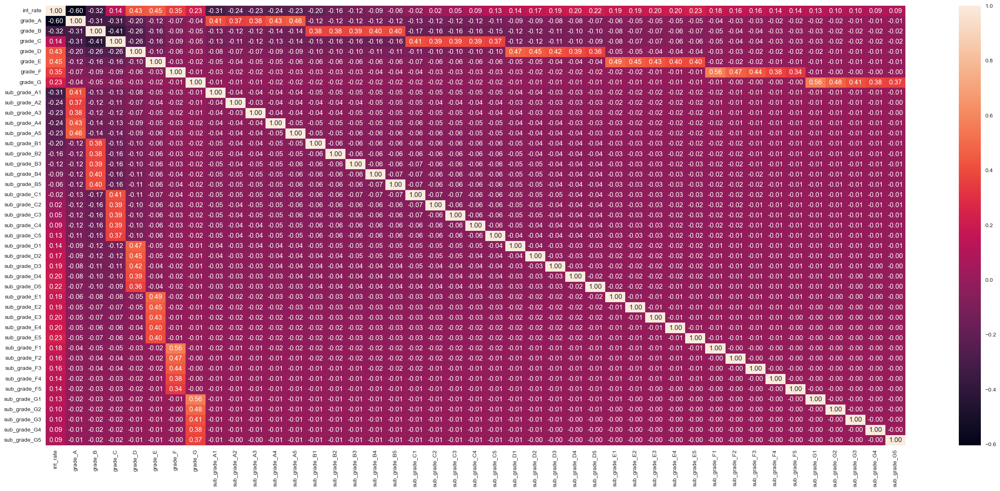

In [33]:
plt.figure(figsize=(34,14))

cols = ['grade', 'sub_grade', 'int_rate']

sns.heatmap(
    data=pd.get_dummies(accepted_train_sample_df[cols]).corr(),
    annot=True,
    fmt='.2f'
)

plt.show()

We can definately see a pattern in terms of grades and subgrades that higher grade, subgrade (in alphabetical order) corresponds to higher interest rate.

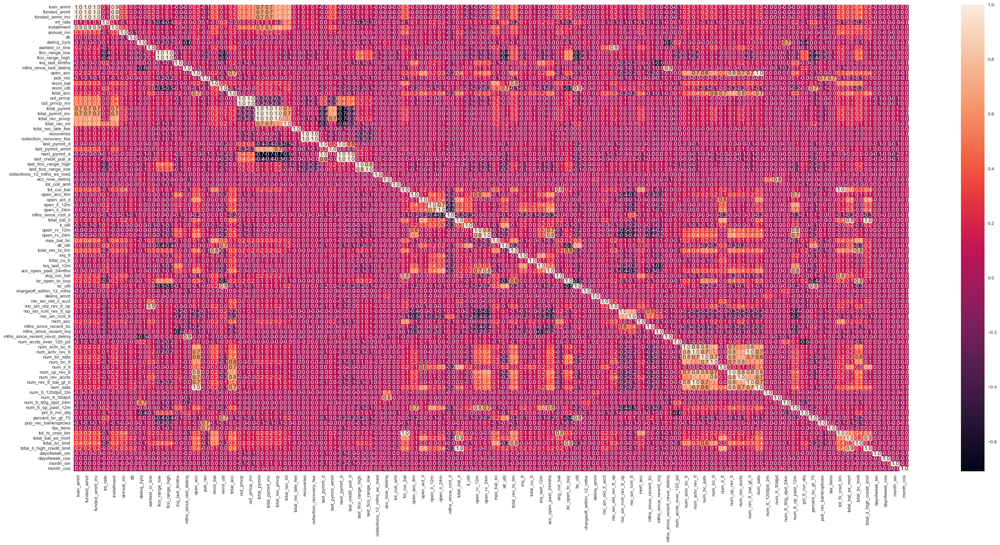

In [31]:
plt.figure(figsize=(40,18))

sns.heatmap(
    data=accepted_train_sample_df.corr(),
    annot=True,
    fmt='.1f'
)

plt.show()

We can see that there are perfect or near perfect correlations among some features, so we would definately benefit from feature reduction.

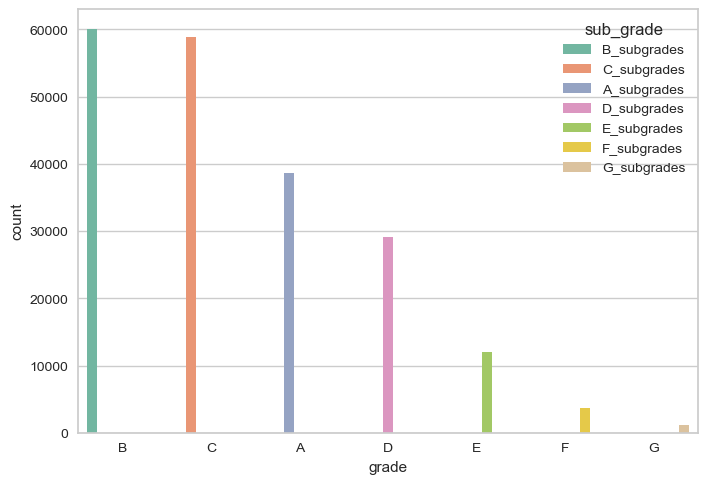

In [50]:
sns.countplot(
    x=accepted_train_sample_df['grade'],
    hue=accepted_train_sample_df['sub_grade'].apply(lambda x: x[0]+'_subgrades'),
    palette='Set2'
)

plt.show()

We can see that subgrade letter corresponds to its grade and there can't be any, for example, B subgrade in A grades.

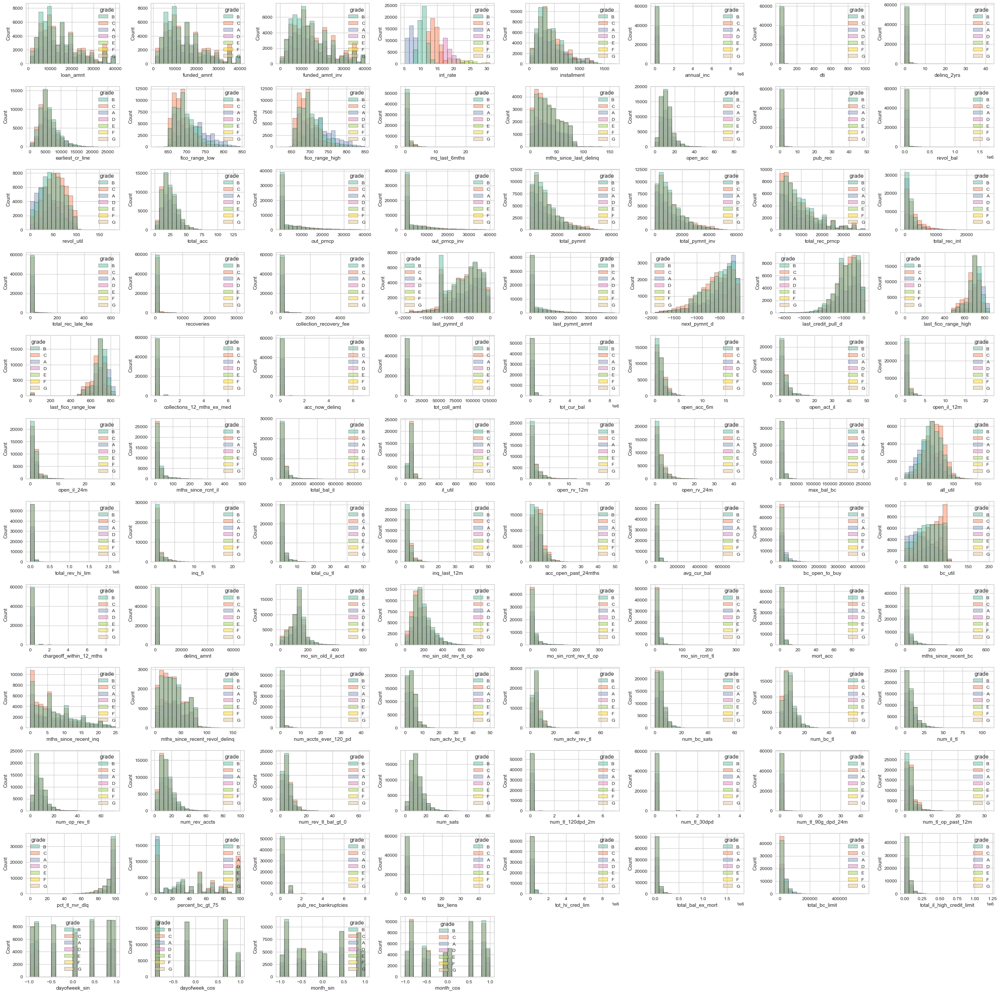

In [12]:
cols = accepted_train_sample_df.select_dtypes(include='float').columns

plot_subplots(
    df=accepted_train_sample_df,
    feature_names=cols,
    plot_func=sns.histplot,
    plot_on_x=True,
    plot_hue='grade',
    n_rows=12,
    n_cols=8,
    size=(30, 30),
    kwargs={'bins':20, 'palette':'Set2'}
)

Most of the time we don't see much difference in distributions in terms of grades, but there is a clear difference with interest rate.

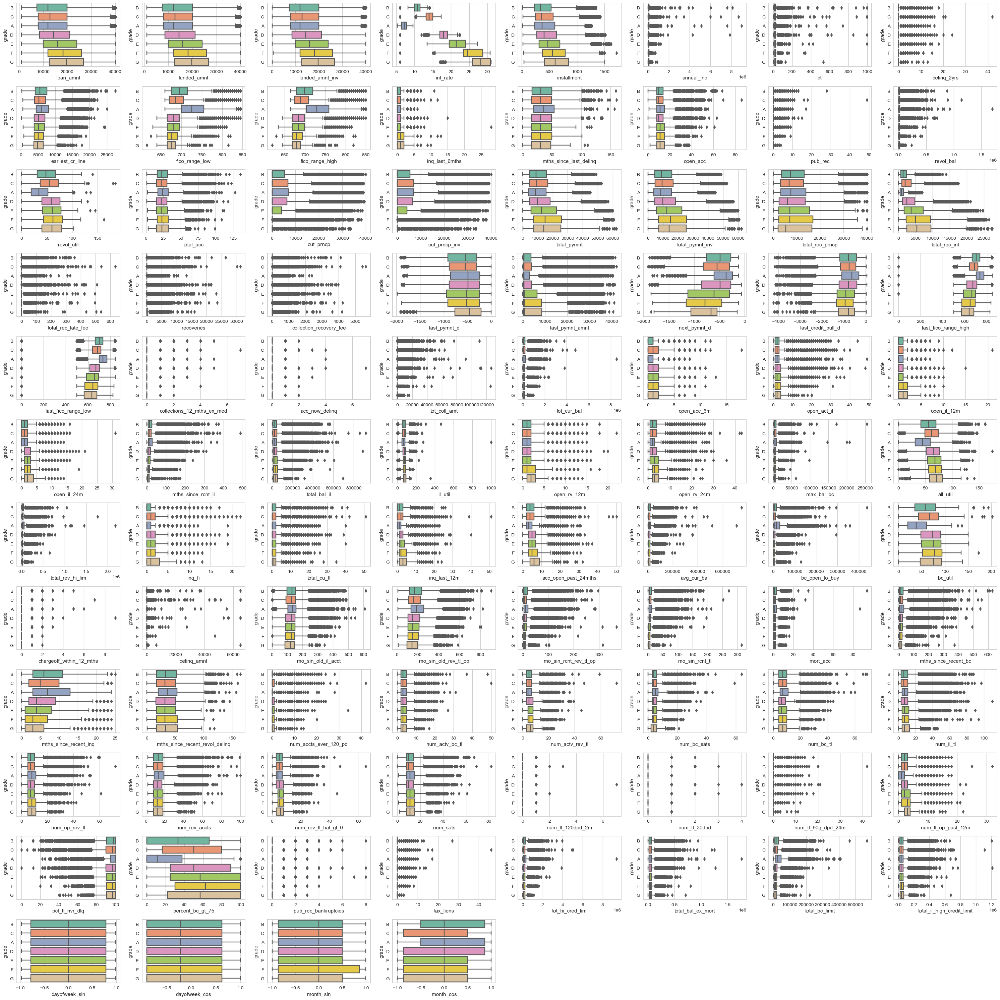

In [46]:
plot_subplots(
    df=accepted_train_sample_df,
    feature_names=cols,
    plot_func=sns.boxplot,
    plot_on_x=True,
    plot_y='grade',
    n_rows=12,
    n_cols=8,
    size=(30, 30),
    kwargs={'orient':'h', 'palette':'Set2'}
)

We see that a lot of features have huge outliers.

### Grade prediction

#### Model and feature selection

**Model selection**

In [8]:
cat_features = [
    'term', 'emp_title', 'emp_length','home_ownership', 'verification_status', 
    'loan_status', 'pymnt_plan','purpose', 'title', 'zip_code', 'addr_state', 
    'initial_list_status', 'application_type', 'hardship_flag', 'disbursement_method',
    'debt_settlement_flag'
]

X_train = accepted_train_sample_df\
    .drop(columns=['grade', 'issue_d', 'sub_grade', 'int_rate'])\
    .astype({col:'category' for col in cat_features})

le = LabelEncoder()

y_train = le.fit_transform(accepted_train_sample_df['grade'])

le.classes_

array(['A', 'B', 'C', 'D', 'E', 'F', 'G'], dtype=object)

In [9]:
features = X_train.columns

num_features = X_train.select_dtypes(include='float').columns

cat_features = X_train.select_dtypes(include=['object','category']).columns


num_transformer = Pipeline(
    steps=[
        ("scaler", RobustScaler()),
        ("num_imputer", SimpleImputer(strategy='median', add_indicator=True))
    ]
)

cat_transformer = Pipeline(
    steps=[
        ("cat_imputer", SimpleImputer(strategy="most_frequent", add_indicator=True)),
        ("oh_encoder", OneHotEncoder(drop='if_binary', handle_unknown="ignore"))
    ]
)

col_transformer = ColumnTransformer(
    transformers=[
        ("num", num_transformer, num_features),
        ("cat", cat_transformer, cat_features),
    ]
)

In [15]:
d_clf = DummyClassifier(strategy='most_frequent', random_state=0)

xgb_clf = XGBClassifier(
    random_state=0,
    enable_categorical=True,
    tree_method='hist',
    num_class=len(le.classes_)
)

lgbm_clf = LGBMClassifier(
    random_state=0,
)

lr_clf = Pipeline(steps=[
    ('preprocessor', col_transformer),
    ('classifier', LogisticRegression(class_weight='balanced', C=0.8))
])

In [63]:
metrics = ['roc_auc_ovr']

models = {
    'Dummy':d_clf,
    'LogisticRegression':lr_clf,
    'XGBoost':xgb_clf,
    'LGBM':lgbm_clf
}

cross_validate_models(
    models=models,
    preprocessor=None,
    X_train=X_train,
    y_train=y_train,
    metrics=metrics,
    cv_folds=10
)

,model_name,mean_roc_auc_ovr,std_roc_auc_ovr
0,Dummy,0.500,0.000
1,LogisticRegression,0.703,0.004
2,XGBoost,0.963,0.002
3,LGBM,0.958,0.002


**Dimensionality reduction**

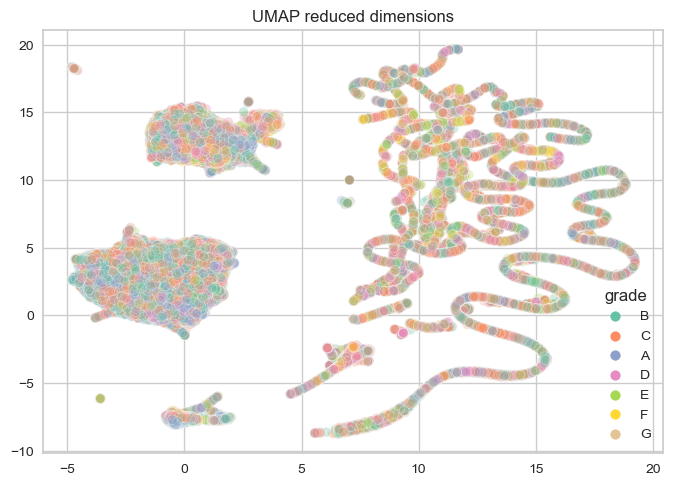

In [50]:
X_train_dr = col_transformer.fit_transform(X_train)

X_reduced_umap = UMAP().fit_transform(X_train_dr)

ax = sns.scatterplot(
    x=X_reduced_umap[:,0],
    y=X_reduced_umap[:,1],
    hue=accepted_train_sample_df['grade'],
    alpha=0.3,
    palette='Set2'
)

ax.set_title('UMAP reduced dimensions')

plt.show()

**Feature selection**

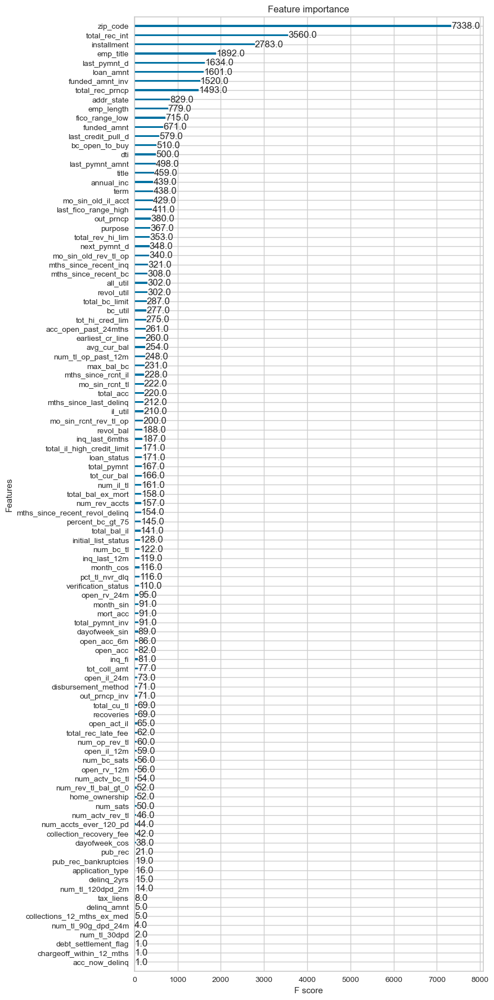

In [81]:
xgb_clf.fit(X_train, y_train)

fig, ax = plt.subplots(1, 1, figsize=(8,22))

xgboost.plot_importance(xgb_clf, ax=ax)

plt.show()

In [ ]:
X, X_val, y, y_val = train_test_split(
    X_train, y_train, test_size=0.1, stratify=y_train, random_state=0)

rfe = BoostBoruta(xgb_clf, n_jobs=-1, max_iter=200)
_ = rfe.fit(X, y, eval_set=[(X_val, y_val)], early_stopping_rounds=6)

cols_selected = X_train.iloc[:,rfe.get_support()].columns

In [68]:
cols_selected

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'installment',
       'fico_range_low', 'initial_list_status', 'total_rec_prncp',
       'total_rec_int', 'last_pymnt_d', 'last_fico_range_high',
       'disbursement_method'],
      dtype='object')

In [66]:
cross_validate_models(
    models={
        'XGBoost':xgb_clf,
        'LGBM':lgbm_clf
    },
    preprocessor=None,
    X_train=X_train[cols_selected],
    y_train=y_train,
    metrics=metrics,
    cv_folds=10
)

,model_name,mean_roc_auc_ovr,std_roc_auc_ovr
0,XGBoost,0.981,0.001
1,LGBM,0.973,0.002


In [18]:
X_train = X_train[cols_selected]

micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging
`n_features_in_` is deprecated in 1.0 and will be removed in 1.2.
micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging
micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging


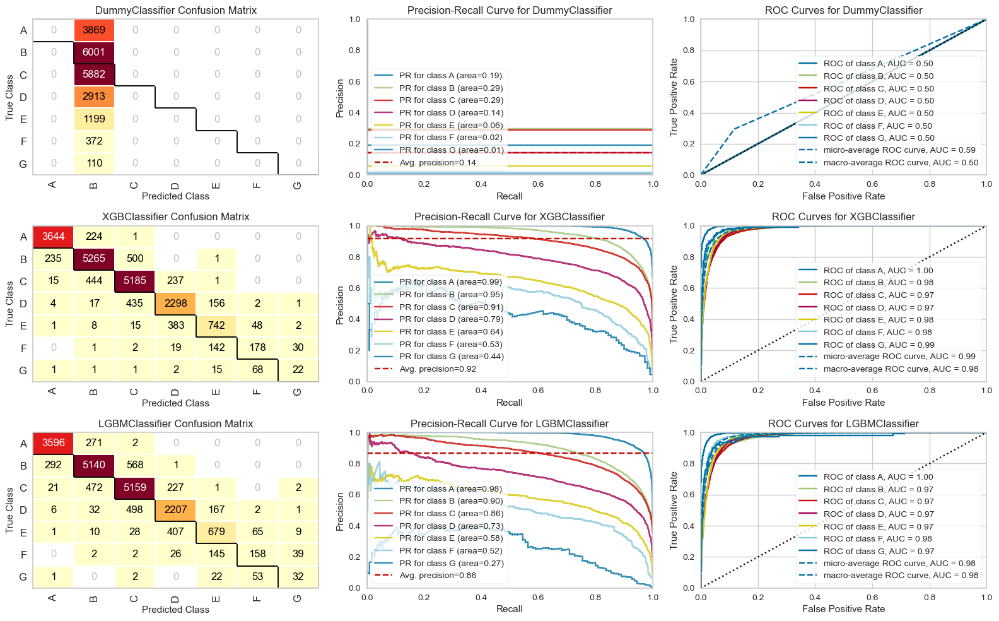

In [76]:
plot_cm_pr_roc_curves_yb(
    models={
        'Dummy':d_clf,
        'XGBoost':xgb_clf,
        'LGBM':lgbm_clf
    },
    X=X_train,
    y=y_train,
    plot_size=(16, 10),
    class_labels=le.classes_
)

#### Hyperparameter tuning

In [ ]:
optimized_models = {}

xgb_study = optuna.create_study(direction='maximize', sampler=TPESampler())
xgb_study.optimize(
    lambda trial : xgb_objective(trial, X_train, y_train, score='roc_auc_ovr'),
    n_trials=20,
    n_jobs=-1
)

optimized_models['XGBoost'] = XGBClassifier(
    enable_categorical=True,
    tree_method='hist',
    nthread=-1,
    random_state=0,
    num_class=len(le.classes_),
    **xgb_study.best_trial.params
)

In [16]:
optimized_models['XGBoost']

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, early_stopping_rounds=None,
              enable_categorical=True, eval_metric=None, feature_types=None,
              gamma=1.5, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.18000000000000002,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=21, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              n_estimators=150, n_jobs=None, nthread=-1, num_class=7,
              num_parallel_tree=None, ...)

In [ ]:
lgbm_study = optuna.create_study(direction='maximize', sampler=TPESampler())
lgbm_study.optimize(
    lambda trial : lgbm_objective(trial, X_train, y_train, score='roc_auc_ovr'),
    n_trials=20,
    n_jobs=-1
)

optimized_models['LGBM'] = LGBMClassifier(
    random_state=0,
    **lgbm_study.best_trial.params
)

In [13]:
optimized_models['LGBM'] = LGBMClassifier(random_state=0)

In [17]:
cross_validate_models(
    models=optimized_models,
    X_train=X_train,
    y_train=y_train,
    metrics=metrics,
    cv_folds=10
)

,model_name,mean_roc_auc_ovr,std_roc_auc_ovr
0,XGBoost,0.984,0.001
1,LGBM,0.961,0.002


Hyperparameter didn't help improve performance so let's use default parameters.

#### Evaluation on test set

In [20]:
y_train=LabelEncoder().fit_transform(accepted_train_df['grade'])
y_test=LabelEncoder().fit_transform(accepted_test_df['grade'])

X_train = accepted_train_df\
    .drop(columns=['grade', 'issue_d', 'sub_grade', 'int_rate'])\
    .astype({col:'category' for col in cat_features})

X_test = accepted_test_df\
    .drop(columns=['grade', 'issue_d', 'sub_grade', 'int_rate'])\
    .astype({col:'category' for col in cat_features})

In [21]:
metrics_fcn = {
    'roc_auc':lambda y_true, y_pred: roc_auc_score(
        y_true, y_pred, multi_class='ovr')
}

results, fitted_models = evaluate_models(
    models={'XGBoost':xgb_clf, 'LGBM':lgbm_clf},
    X_train=X_train[cols_selected],
    y_train=y_train,
    X_test=X_test[cols_selected],
    y_test=y_test,
    metrics_fcn=metrics_fcn,
    return_models=True,
    multi_class=True
)

results

,model_name,roc_auc
0,XGBoost,0.984
1,LGBM,0.969


micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging
micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging


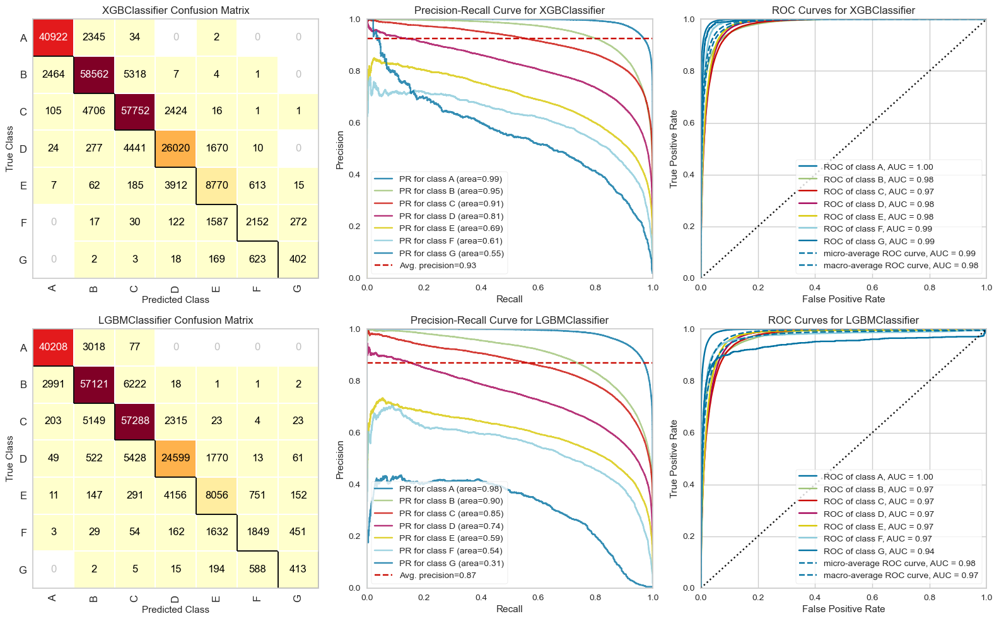

In [22]:
plot_cm_pr_roc_curves_yb(
    models=fitted_models,
    X=X_train[cols_selected],
    y=y_train,
    X_test=X_test[cols_selected],
    y_test=y_test,
    plot_size=(16, 10),
    class_labels=le.classes_
)

Overall, we can see that xgboost model perfoms better. It has better ROC AUC, average precision and makes less errors classifying different classes.

In [23]:
_ = joblib.dump(fitted_models['XGBoost'], 'grade_clf_xgb.pkl')

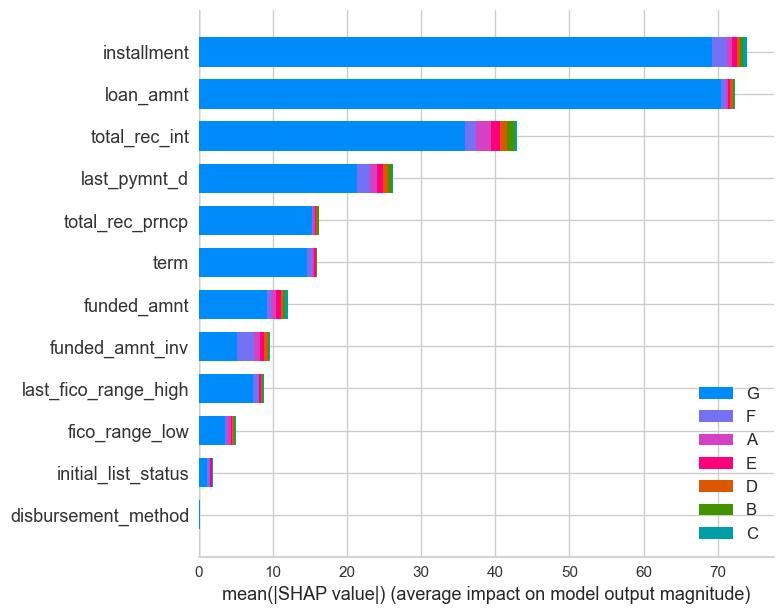

In [25]:
explainer = shap.TreeExplainer(fitted_models['LGBM'])

shap_values = explainer.shap_values(X_test[cols_selected])

shap.summary_plot(shap_values, X_test[cols_selected], class_names=le.classes_)

We can see that most features contribute the most to differentiate the G class probably, because this class is rather rare. Also, the most impactful feature for grade prediction seem to be installment.

### Subgrade prediction

#### Model and feature selection

**Model selection**

In [6]:
cat_features = [
    'term', 'emp_title', 'emp_length','home_ownership', 'verification_status', 
    'loan_status', 'pymnt_plan','purpose', 'title', 'zip_code', 'addr_state', 
    'initial_list_status', 'application_type', 'hardship_flag', 'disbursement_method',
    'debt_settlement_flag', 'grade'
]

X_train = accepted_train_sample_df\
    .drop(columns=['issue_d', 'sub_grade', 'int_rate'])\
    .astype({col:'category' for col in cat_features})

le = LabelEncoder()

y_train = le.fit_transform(accepted_train_sample_df['sub_grade'].apply(lambda x: x[1]))

le.classes_

array(['1', '2', '3', '4', '5'], dtype=object)

In [11]:
features = X_train.columns

num_features = X_train.select_dtypes(include='float').columns

cat_features = X_train.select_dtypes(include=['object','category']).columns

col_transformer = ColumnTransformer(
    transformers=[
        ("num", num_transformer, num_features),
        ("cat", cat_transformer, cat_features),
    ]
)

In [12]:
d_clf = DummyClassifier(strategy='most_frequent', random_state=0)

xgb_clf = XGBClassifier(
    random_state=0,
    enable_categorical=True,
    tree_method='hist',
    num_class=len(le.classes_)
)

lgbm_clf = LGBMClassifier(
    random_state=0,
)

lr_clf = Pipeline(steps=[
    ('preprocessor', col_transformer),
    ('classifier', LogisticRegression(class_weight='balanced', C=0.8))
])

In [39]:
metrics = ['roc_auc_ovr']

models = {
    'Dummy':d_clf,
    'LogisticRegression':lr_clf,
    'XGBoost':xgb_clf,
    'LGBM':lgbm_clf
}

cross_validate_models(
    models=models,
    preprocessor=None,
    X_train=X_train,
    y_train=y_train,
    metrics=metrics,
    cv_folds=10
)

,model_name,mean_roc_auc_ovr,std_roc_auc_ovr
0,Dummy,0.500,0.000
1,LogisticRegression,0.531,0.001
2,XGBoost,0.658,0.003
3,LGBM,0.681,0.003


**Feature selection**

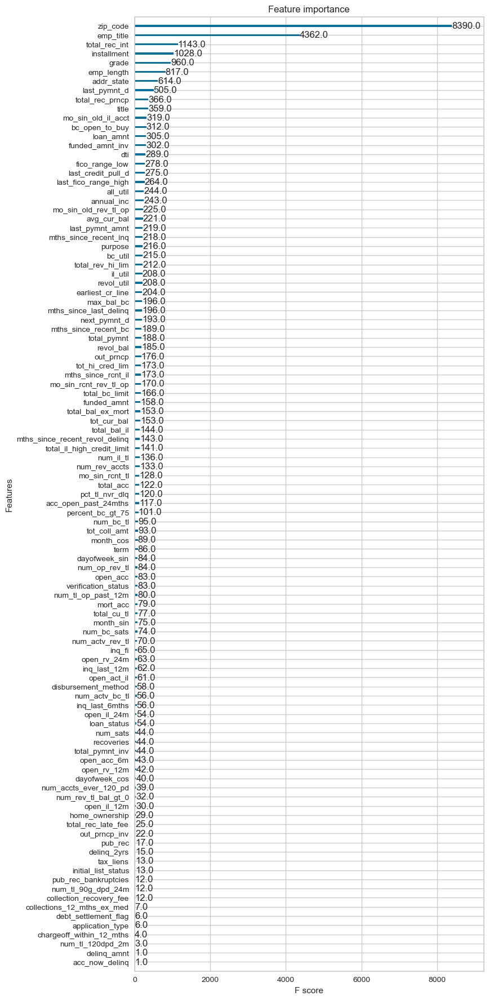

In [40]:
xgb_clf.fit(X_train, y_train)

fig, ax = plt.subplots(1, 1, figsize=(8,22))

xgboost.plot_importance(xgb_clf, ax=ax)

plt.show()

In [ ]:
X, X_val, y, y_val = train_test_split(
    X_train, y_train, test_size=0.1, stratify=y_train, random_state=0)

rfe = BoostBoruta(xgb_clf)
_ = rfe.fit(X, y, eval_set=[(X_val, y_val)], early_stopping_rounds=6)

cols_selected = X_train.iloc[:,rfe.get_support()].columns

In [45]:
cols_selected

Index(['funded_amnt', 'funded_amnt_inv', 'term', 'installment', 'grade',
       'fico_range_low', 'total_rec_int'],
      dtype='object')

In [46]:
cross_validate_models(
    models={
        'XGBoost':xgb_clf,
        'LGBM':lgbm_clf
    },
    preprocessor=None,
    X_train=X_train[cols_selected],
    y_train=y_train,
    metrics=metrics,
    cv_folds=10
)

,model_name,mean_roc_auc_ovr,std_roc_auc_ovr
0,XGBoost,0.824,0.001
1,LGBM,0.799,0.002


In [15]:
X_train = X_train[cols_selected]

micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging
`n_features_in_` is deprecated in 1.0 and will be removed in 1.2.
micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging
micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging


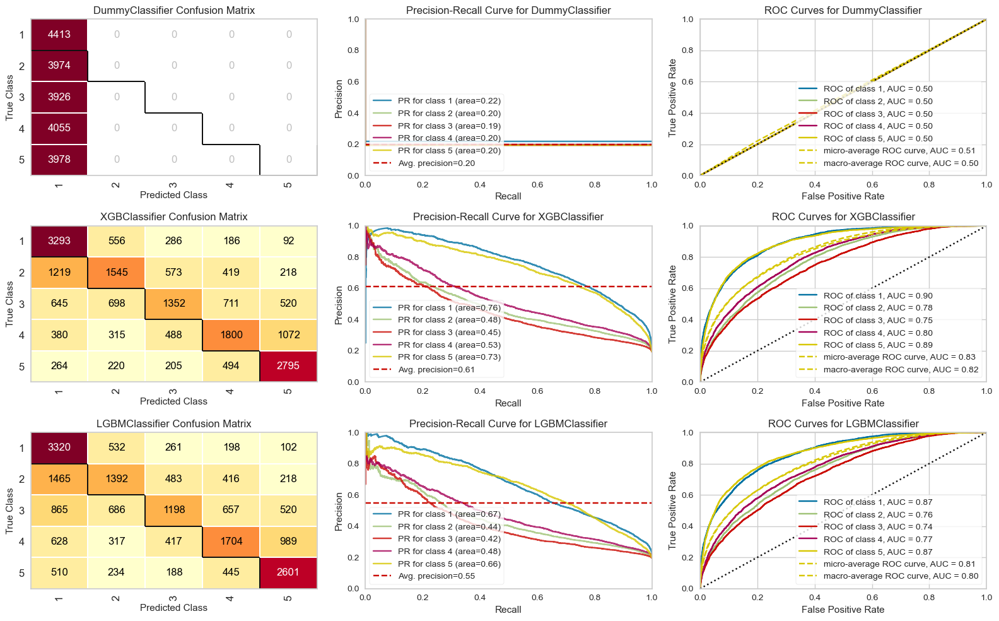

In [52]:
plot_cm_pr_roc_curves_yb(
    models={
        'Dummy':d_clf,
        'XGBoost':xgb_clf,
        'LGBM':lgbm_clf
    },
    X=X_train,
    y=y_train,
    plot_size=(16, 10),
    class_labels=le.classes_
)

#### Hyperparameter tuning

In [ ]:
optimized_models = {}

xgb_study = optuna.create_study(direction='maximize', sampler=TPESampler())
xgb_study.optimize(
    lambda trial : xgb_objective(trial, X_train, y_train, score='roc_auc_ovr'),
    n_trials=100,
    n_jobs=-1
)

optimized_models['XGBoost'] = XGBClassifier(
    enable_categorical=True,
    tree_method='hist',
    nthread=-1,
    random_state=0,
    num_class=len(le.classes_),
    **xgb_study.best_trial.params
)

In [25]:
optimized_models['XGBoost']

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, early_stopping_rounds=None,
              enable_categorical=True, eval_metric=None, feature_types=None,
              gamma=0.7000000000000001, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.3, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=21,
              max_leaves=None, min_child_weight=0, missing=nan,
              monotone_constraints=None, n_estimators=450, n_jobs=None,
              nthread=-1, num_class=5, num_parallel_tree=None, ...)

In [ ]:
lgbm_study = optuna.create_study(direction='maximize', sampler=TPESampler())
lgbm_study.optimize(
    lambda trial : lgbm_objective(trial, X_train, y_train, score='roc_auc_ovr'),
    n_trials=100,
    n_jobs=-1
)

optimized_models['LGBM'] = LGBMClassifier(
    random_state=0,
    **lgbm_study.best_trial.params
)

In [21]:
optimized_models['LGBM']

LGBMClassifier(bagging_fraction=0.78, bagging_freq=1,
               feature_fraction=0.9000000000000001, lambda_l1=0, lambda_l2=90,
               learning_rate=0.15976895163071542, max_depth=11,
               min_data_in_leaf=500, min_gain_to_split=0.06106169565928182,
               n_estimators=650, num_leaves=400, random_state=0)

In [28]:
cross_validate_models(
    models=optimized_models,
    X_train=X_train,
    y_train=y_train,
    metrics=metrics,
    cv_folds=10
)

,model_name,mean_roc_auc_ovr,std_roc_auc_ovr
0,LGBM,0.853,0.002
1,XGBoost,0.862,0.001


We can see that hyperparameter tuning helped to improve model performance.

#### Evaluation on test set

In [11]:
y_train = LabelEncoder().fit_transform(accepted_train_df['sub_grade'].apply(lambda x: x[1]))
y_test = LabelEncoder().fit_transform(accepted_test_df['sub_grade'].apply(lambda x: x[1]))

X_train = accepted_train_df\
    .drop(columns=['issue_d', 'sub_grade', 'int_rate'])\
    .astype({col:'category' for col in cat_features})

X_test = accepted_test_df\
    .drop(columns=['issue_d', 'sub_grade', 'int_rate'])\
    .astype({col:'category' for col in cat_features})

In [16]:
metrics_fcn = {
    'roc_auc':lambda y_true, y_pred: roc_auc_score(
        y_true, y_pred, multi_class='ovr')
}

results, fitted_models = evaluate_models(
    models=optimized_models,
    X_train=X_train[cols_selected],
    y_train=y_train,
    X_test=X_test[cols_selected],
    y_test=y_test,
    metrics_fcn=metrics_fcn,
    return_models=True,
    multi_class=True
)

fitted_models

[LightGBM] [Warning] feature_fraction is set=0.9000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.06106169565928182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06106169565928182
[LightGBM] [Warning] bagging_fraction is set=0.78, subsample=1.0 will be ignored. Current value: bagging_fraction=0.78
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


{'LGBM': LGBMClassifier(bagging_fraction=0.78, bagging_freq=1,
                feature_fraction=0.9000000000000001, lambda_l1=0, lambda_l2=90,
                learning_rate=0.15976895163071542, max_depth=11,
                min_data_in_leaf=500, min_gain_to_split=0.06106169565928182,
                n_estimators=650, num_leaves=400, random_state=0)}

In [30]:
metrics_fcn = {
    'roc_auc':lambda y_true, y_pred: roc_auc_score(
        y_true, y_pred, multi_class='ovr')
}

results, fitted_models = evaluate_models(
    models=optimized_models,
    X_train=X_train[cols_selected],
    y_train=y_train,
    X_test=X_test[cols_selected],
    y_test=y_test,
    metrics_fcn=metrics_fcn,
    return_models=True,
    multi_class=True
)

results

[LightGBM] [Warning] feature_fraction is set=0.9000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.06106169565928182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06106169565928182
[LightGBM] [Warning] bagging_fraction is set=0.78, subsample=1.0 will be ignored. Current value: bagging_fraction=0.78
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


,model_name,roc_auc
0,LGBM,0.902
1,XGBoost,0.908


micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging


[LightGBM] [Warning] feature_fraction is set=0.9000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.06106169565928182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06106169565928182
[LightGBM] [Warning] bagging_fraction is set=0.78, subsample=1.0 will be ignored. Current value: bagging_fraction=0.78
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging


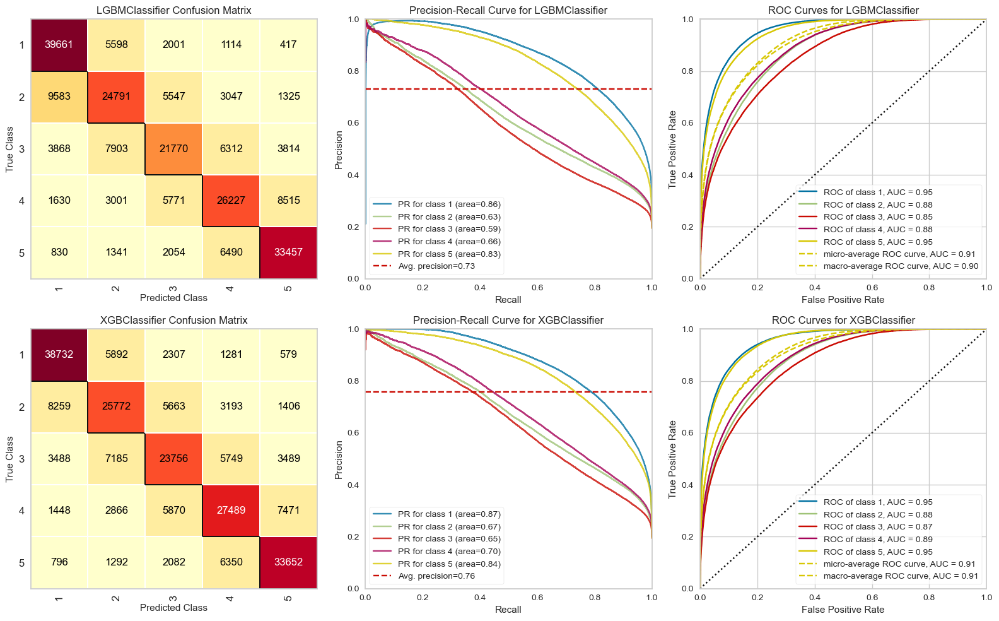

In [48]:
plot_cm_pr_roc_curves_yb(
    models=fitted_models,
    X=X_train[cols_selected],
    y=y_train,
    X_test=X_test[cols_selected],
    y_test=y_test,
    plot_size=(16, 10),
    class_labels=le.classes_
)

Judging by the results xgboost performs better with higher average precision, ROC AUC.

In [31]:
_ = joblib.dump(fitted_models['XGBoost'], "sub_grade_clf_xgb.pkl")

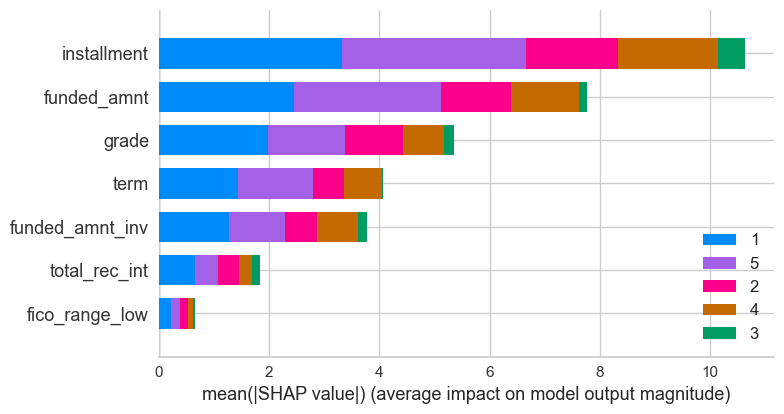

In [20]:
explainer = shap.TreeExplainer(fitted_models['LGBM'])

shap_values = explainer.shap_values(X_test[cols_selected])

shap.summary_plot(shap_values, X_test[cols_selected], class_names=le.classes_)

We can see features arranged by their importance and distribution of impact for every class.

### Interest rate prediction

#### Model and feature selection

**Model selection**

In [21]:
cat_features = [
    'term', 'emp_title', 'emp_length','home_ownership', 'verification_status', 
    'loan_status', 'pymnt_plan','purpose', 'title', 'zip_code', 'addr_state', 
    'initial_list_status', 'application_type', 'hardship_flag', 'disbursement_method',
    'debt_settlement_flag', 'grade'
]

X_train = accepted_train_sample_df\
    .drop(columns=['issue_d', 'sub_grade', 'int_rate'])\
    .astype({col:'category' for col in cat_features})

y_train = accepted_train_sample_df['int_rate']

In [9]:
features = X_train.columns

num_features = X_train.select_dtypes(include='float').columns

cat_features = X_train.select_dtypes(include=['object','category']).columns

col_transformer = ColumnTransformer(
    transformers=[
        ("num", num_transformer, num_features),
        ("cat", cat_transformer, cat_features),
    ]
)

In [10]:
d_reg = DummyRegressor(strategy='median')

xgb_reg = XGBRegressor(
    random_state=0,
    enable_categorical=True,
    tree_method='hist'
)

lgbm_reg = LGBMRegressor(
    random_state=0,
)

lr_reg = Pipeline(steps=[
    ('preprocessor', col_transformer),
    ('classifier', LinearRegression())
])

ridge_reg = Pipeline(steps=[
    ('preprocessor', col_transformer),
    ('classifier', Ridge())
])

lasso_reg = Pipeline(steps=[
    ('preprocessor', col_transformer),
    ('classifier', Lasso())
])

In [15]:
metrics = ['r2', 'neg_mean_squared_error', 'neg_mean_absolute_error']

models = {
    'Dummy':d_reg,
    'LinearRegression':lr_reg,
    'RidgeRegression':ridge_reg,
    'LassoRegression':lasso_reg,
    'XGBoost':xgb_reg,
    'LGBM':lgbm_reg
}

cross_validate_models(
    models=models,
    X_train=X_train,
    y_train=y_train,
    metrics=metrics,
    cv_folds=10
)

,model_name,mean_r2,std_r2,mean_neg_mean_squared_error,std_neg_mean_squared_error,mean_neg_mean_absolute_error,std_neg_mean_absolute_error
0,Dummy,-0.009,0.001,-23.373,0.216,-3.755,0.014
1,LinearRegression,0.930,0.001,-1.623,0.018,-0.999,0.005
2,RidgeRegression,0.875,0.004,-2.889,0.087,-1.212,0.023
3,LassoRegression,0.249,0.002,-17.391,0.175,-3.228,0.011
4,XGBoost,0.964,0.001,-0.832,0.019,-0.692,0.003
5,LGBM,0.961,0.001,-0.915,0.026,-0.757,0.003


**Feature selection**

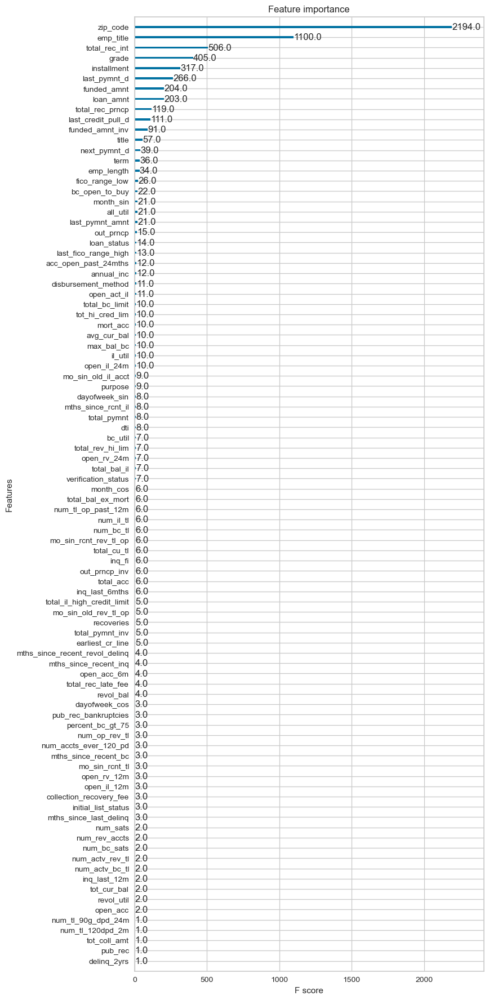

In [16]:
xgb_reg.fit(X_train, y_train)

fig, ax = plt.subplots(1, 1, figsize=(8,22))

xgboost.plot_importance(xgb_reg, ax=ax)

plt.show()

In [ ]:
X, X_val, y, y_val = train_test_split(
    X_train, y_train, test_size=0.1, random_state=0)

rfe = BoostBoruta(xgb_reg, max_iter=200, n_jobs=-1)
_ = rfe.fit(X, y, eval_set=[(X_val, y_val)], early_stopping_rounds=6)

cols_selected_xgb = X_train.iloc[:,rfe.get_support()].columns

In [50]:
cols_selected_xgb

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'installment',
       'grade', 'annual_inc', 'verification_status', 'purpose', 'title',
       'zip_code', 'fico_range_low', 'inq_last_6mths', 'initial_list_status',
       'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'next_pymnt_d',
       'last_credit_pull_d', 'last_fico_range_high', 'tot_coll_amt',
       'open_act_il', 'open_il_12m', 'open_il_24m', 'total_bal_il',
       'open_rv_12m', 'open_rv_24m', 'all_util', 'total_rev_hi_lim', 'inq_fi',
       'inq_last_12m', 'acc_open_past_24mths', 'mort_acc', 'num_bc_sats',
       'num_bc_tl', 'month_sin'],
      dtype='object')

In [41]:
cross_validate_models(
    models={
        'XGBoost':xgb_reg,
        'LGBM':lgbm_reg
    },
    X_train=X_train[cols_selected_xgb],
    y_train=y_train,
    metrics=metrics,
    cv_folds=10
)

,model_name,mean_r2,std_r2,mean_neg_mean_squared_error,std_neg_mean_squared_error,mean_neg_mean_absolute_error,std_neg_mean_absolute_error
0,XGBoost,0.965,0.001,-0.813,0.023,-0.681,0.004
1,LGBM,0.960,0.001,-0.915,0.024,-0.755,0.003


In [53]:
X_train = X_train[cols_selected_xgb]

In [ ]:
X, X_val, y, y_val = train_test_split(
    X_train, y_train, test_size=0.1, random_state=0)

rfe = BoostBoruta(lgbm_reg, max_iter=200, n_jobs=-1)
_ = rfe.fit(X, y, eval_set=[(X_val, y_val)], early_stopping_rounds=6)

cols_selected_lgbm = X_train.iloc[:,rfe.get_support()].columns

In [66]:
cols_selected_lgbm

Index(['loan_amnt', 'installment', 'grade', 'total_rec_int', 'last_pymnt_d'], dtype='object')

In [56]:
cross_validate_models(
    models={
        'XGBoost':xgb_reg,
        'LGBM':lgbm_reg
    },
    X_train=X_train[cols_selected_lgbm],
    y_train=y_train,
    metrics=metrics,
    cv_folds=10
)

,model_name,mean_r2,std_r2,mean_neg_mean_squared_error,std_neg_mean_squared_error,mean_neg_mean_absolute_error,std_neg_mean_absolute_error
0,XGBoost,0.976,0.001,-0.559,0.014,-0.514,0.003
1,LGBM,0.952,0.001,-1.103,0.019,-0.803,0.003


In [9]:
X_train = X_train[cols_selected_lgbm]

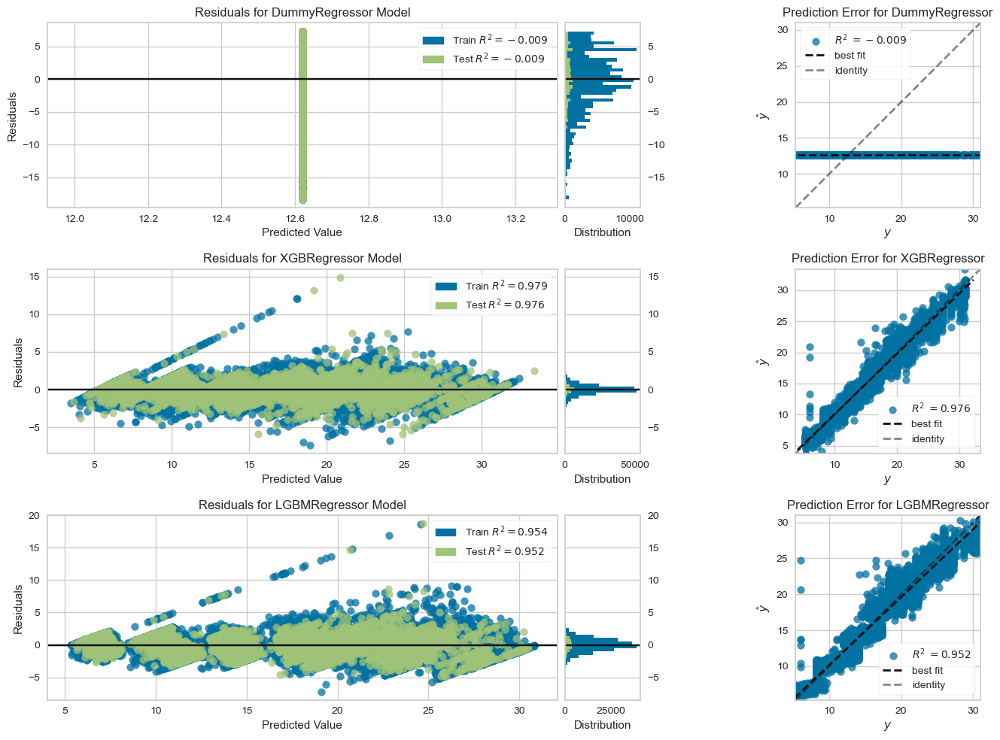

In [71]:
plot_residuals_yb(
    models={
        'Dummy':d_reg,
        'XGBoost':xgb_reg,
        'LGBM':lgbm_reg
    },
    X=X_train,
    y=y_train,
    plot_size=(16, 10)
)

#### Hyperparameter tuning

In [ ]:
optimized_models = {}

xgb_study = optuna.create_study(direction='maximize', sampler=TPESampler())
xgb_study.optimize(
    lambda trial : xgb_objective(trial, X_train, y_train, score='r2', classification=False),
    n_trials=20,
    n_jobs=-1
)

optimized_models['XGBoost'] = XGBRegressor(
    enable_categorical=True,
    tree_method='hist',
    nthread=-1,
    random_state=0,
    **xgb_study.best_trial.params
)

In [21]:
optimized_models['XGBoost']

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=1.0, early_stopping_rounds=None,
             enable_categorical=True, eval_metric=None, feature_types=None,
             gamma=4.1, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.13, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=21, max_leaves=None,
             min_child_weight=4, missing=nan, monotone_constraints=None,
             n_estimators=400, n_jobs=None, nthread=-1, num_parallel_tree=None,
             predictor=None, ...)

In [ ]:
lgbm_study = optuna.create_study(direction='maximize', sampler=TPESampler())
lgbm_study.optimize(
    lambda trial : lgbm_objective(trial, X_train, y_train, score='r2', classification=False),
    n_trials=20,
    n_jobs=-1
)

optimized_models['LGBM'] = LGBMRegressor(
    random_state=0,
    **lgbm_study.best_trial.params
)

In [23]:
optimized_models['LGBM']

LGBMRegressor(bagging_fraction=0.9000000000000001, bagging_freq=1,
              feature_fraction=0.8600000000000001, lambda_l1=10, lambda_l2=60,
              learning_rate=0.25943612839995644, max_depth=6,
              min_data_in_leaf=1700, min_gain_to_split=1.063380736043269,
              n_estimators=350, num_leaves=720, random_state=0)

In [26]:
cross_validate_models(
    models=optimized_models,
    X_train=X_train,
    y_train=y_train,
    metrics=metrics,
    cv_folds=10
)

,model_name,mean_r2,std_r2,mean_neg_mean_squared_error,std_neg_mean_squared_error,mean_neg_mean_absolute_error,std_neg_mean_absolute_error
0,XGBoost,0.985,0.001,-0.344,0.016,-0.372,0.003
1,LGBM,0.976,0.001,-0.560,0.013,-0.481,0.003


Hyperparameter tuning helped to improve model performance.

#### Evaluation on test set

In [20]:
X_train = accepted_train_df\
    .drop(columns=['issue_d', 'sub_grade', 'int_rate'])\
    .astype({col:'category' for col in cat_features})

X_test = accepted_test_df\
    .drop(columns=['issue_d', 'sub_grade', 'int_rate'])\
    .astype({col:'category' for col in cat_features})

y_train = accepted_train_df['int_rate']
y_test = accepted_test_df['int_rate']

metrics_fcn = {
    'r2':r2_score, 
    'mean_squared_error':mean_squared_error, 
    'mean_absolute_error':mean_absolute_error
}

results, fitted_models = evaluate_models(
    models=optimized_models,
    X_train=X_train[cols_selected_lgbm],
    y_train=y_train,
    X_test=X_test[cols_selected_lgbm],
    y_test=y_test,
    metrics_fcn=metrics_fcn,
    return_models=True
)

results

,model_name,r2,mean_squared_error,mean_absolute_error
0,XGBoost,0.992,0.180,0.245
1,LGBM,0.984,0.379,0.383


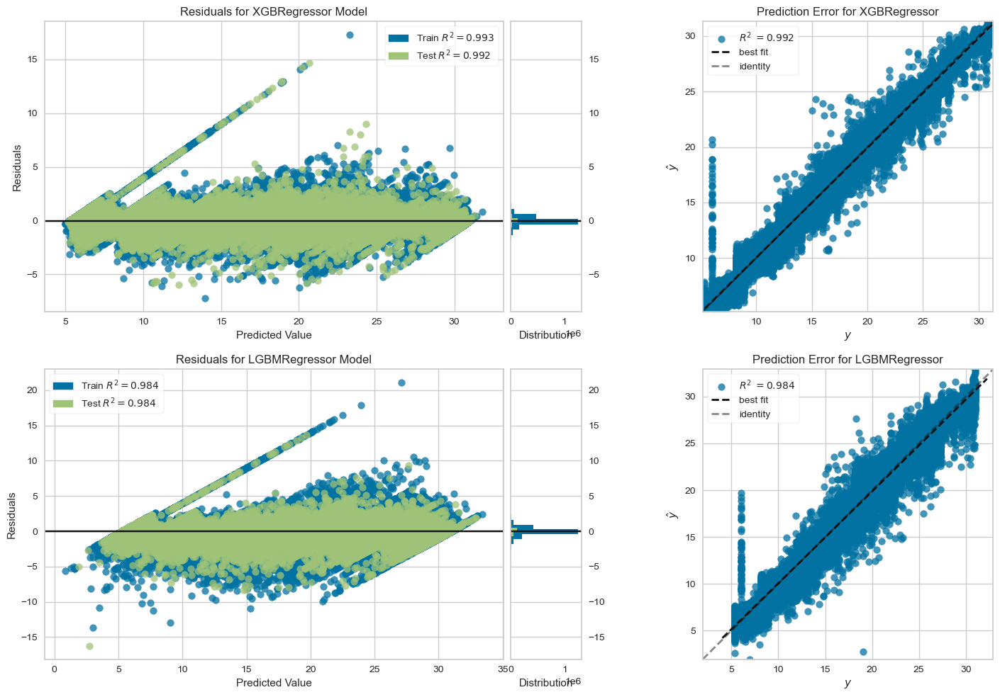

In [33]:
plot_residuals_yb(
    models=fitted_models,
    X=X_train[cols_selected_lgbm],
    y=y_train,
    X_test=X_test[cols_selected_lgbm],
    y_test=y_test,
    plot_size=(16, 10)
)

Judging by the results xgboost performs better. We can also see some outlier data where the residuals are quite high.

In [34]:
_ = joblib.dump(fitted_models['XGBoost'], "int_rate_reg_xgb.pkl")

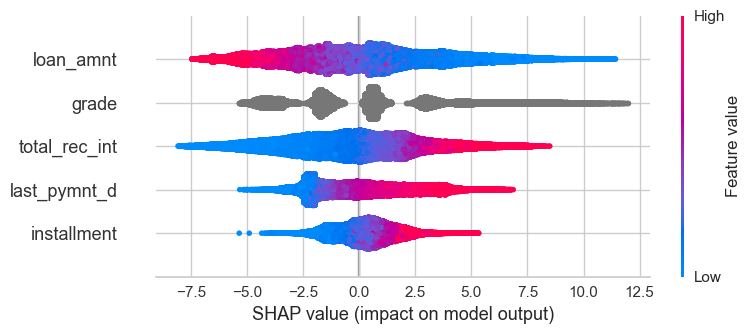

In [21]:
explainer = shap.TreeExplainer(fitted_models['LGBM'])

shap_values = explainer.shap_values(X_test[cols_selected_lgbm])

shap.summary_plot(shap_values, X_test[cols_selected_lgbm])

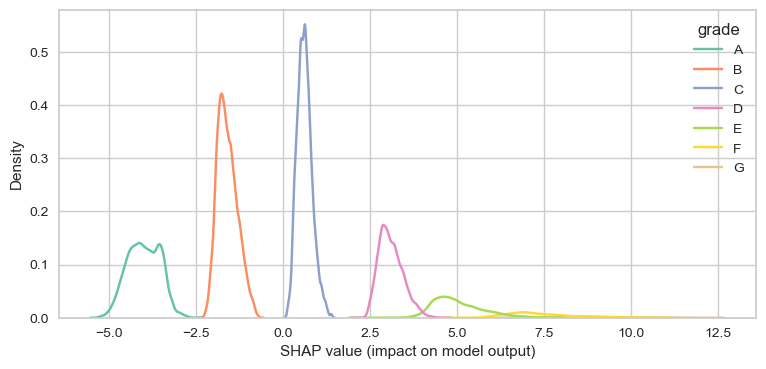

In [117]:
plt.figure(figsize=(9,4))

ax = sns.kdeplot(x=shap_values[:,2], hue=X_test['grade'], palette="Set2")
ax.set_xlabel('SHAP value (impact on model output)')

plt.show()

Here we see that loan amount has the highest impact on the model output. Also, low values of loan amount seem to have positve impact on model output.

Confidence interval for interest rate generalization error.

In [50]:
int_rate_reg = joblib.load('api_code/int_rate_reg_xgb.pkl')

pred = int_rate_reg.predict(X_test[cols_selected_lgbm])


confidence = 0.95


errors = np.abs(pred - y_test)

mean_abs_error_ci = stats.t.interval(confidence, len(errors) - 1, 
    loc=errors.mean(), scale=stats.sem(errors))

mean_abs_error = round(errors.mean(), 3)


errors = (pred - y_test) ** 2

mean_sqrt_error_ci = stats.t.interval(confidence, len(errors) - 1, 
    loc=errors.mean(), scale=stats.sem(errors))

mean_sqrt_error = round(errors.mean(), 3)


print(f'95% confidence interval for mean absolute error: '+
f'{mean_abs_error} -/+ {round(mean_abs_error - mean_abs_error_ci[0], 6)}\n'+
f'95% confidence interval for mean squared error: '+
f'{mean_sqrt_error} -/+ {round(mean_sqrt_error - mean_sqrt_error_ci[0], 6)}')

95% confidence interval for mean absolute error: 0.256 -/+ 0.001208
95% confidence interval for mean squared error: 0.188 -/+ 0.00564


## API test

In [51]:
api_features = [
    'initial_list_status', 'total_rec_prncp', 'last_fico_range_high',
    'disbursement_method','funded_amnt', 'funded_amnt_inv', 'term',
    'fico_range_low', 'loan_amnt', 'installment', 'grade', 'total_rec_int', 
    'last_pymnt_d','title','fico_range_high','emp_length'
]

In [52]:
json_data = {
    "instances":[
        ["f", 7000.00, 644.0, "Cash", 7000.0, 7000.0, "36 months", 752.0, 7000.0, 259.15, "D", 1605.42, -515.0, "debt_consolidation", 752.0, "9 years"],
        ["w", 9137.00, 624.0, "Cash", 15000.0, 15000.0, "36 months", 695.0, 15000.0, 534.72, "D", 3585.15, -730.0, "debt_consolidation", 699.0, "< 1 year"],
        ["w", 10512.17, 574.0, "Cash", 35000.0, 35000.0, "36 months", 670.0, 35000.0, 1269.73, "D", 6224.97, -426.0, "other", 674.0, "< 1 year"],
        ["f", 26875.00, 559.0, "Cash", 26875.0, 26775.0, "36 months", 752.0, 26875.0, 1118.78, "G", 13453.33, -1157.0, "debt_consolidation", 752.0, "10+ years"],
        ["w", 32000.00, 719.0, "Cash", 32000.0, 32000.0, "60 months", 715.0, 32000.0, 704.25, "B", 7269.37, -882.0, "debt_consolidation", 719.0, "8 years"]
    ]
}

In [53]:
resp = requests.post(
    'https://projectapi-t3oyhqidxq-uc.a.run.app', 
    json=json_data
)

print(resp.json())

{'grade_prediction': ['D', 'F'], 'interest_rate_prediction': [9.329943656921387, 14.387755393981934], 'loan_classification': [1, 0, 0, 1, 0], 'sub_grade_prediction': ['D5', 'F5']}


## Summary of the project

Here are the main results of the project:
- Loan classification:
    - Selected features, ordered by their importance: credit_score, employment_length, loan_title.
    - Best model - LGBM with roc_auc=0.956, pr_auc=0.874.
- Grade classification:
    - Selected features, ordered by their importance: installment, loan_amnt, total_rec_int, last_pymnt_d, total_rec_prncp, term, funded_amnt, funded_amnt_inv, last_fico_range_high, fico_range_low, initial_list_status, disbursement_method.
    - Best model - XGBoost with roc_auc=0.984, pr_auc=0.93.
- Sub grade classification:
    - Selected features, ordered by their importance: installment, funded_amnt, grade, term, funded_amnt_inv, total_rec_int, fico_range_low.
    - Best model - XGBoost with roc_auc=0.908, pr_auc=0.76.
- Interest rate classification:
    - Selected features, ordered by their importance: loan_amnt, grade, total_rec_int, last_pymnt_d, installment.
    - Best model - XGBoost with r2=0.992, mean_squared_error - 0.188 -/+ 0.00564, mean_absolute_error - 0.256 -/+ 0.001208.

**Suggestions for improvement**

- Use more automation for feature engineering, model and feature selection, hyperparameter tuning.
- Figure out a better way to handle large amounts of data. Possibly use cloud resources.
- Utilize GPU for models that can use them.